# Project5: Ensemble Techniques - Travel Package Purchase Prediction

## Description

## Objective

To predict which customer is more likely to purchase the newly introduced travel package.

### 1.CustomerID: Unique customer ID
### 2.ProdTaken: Whether the customer has purchased a package or not (0: No, 1: Yes)
### 3.Age: Age of customer
### 4.TypeofContact: How customer was contacted (Company Invited or Self Inquiry)
### 5. CityTier: City tier depends on the development of a city, population, facilities, and living standards. The categories are ordered i.e. Tier 1 > Tier 2 > Tier 3
###  6.DurationOfPitch: Duration of the pitch by a salesperson to the customer
### 7.Occupation: Occupation of customer
### 8. Gender: Gender of customer
### 9.NumberOfPersonVisiting: Total number of persons planning to take the trip with the customer
### 10.NumberOfFollowups: Total number of follow-ups has been done by sales person after sales pitch.
### 11. Product pitched: Product pitched by the salesperson
### 12.PreferredPropertyStar: Preferred hotel property rating by customer
### 13.MaritalStatus: Marital status of customer
### 14.NumberOfTrips: Average number of trips in a year by customer
### 15.Passport: The customer has a passport or not (0: No, 1: Yes)
### 16.PitchSatisfactionScore: Sales pitch satisfaction score.
### 17.OwnCar: Whether the customers own a car or not (0: No, 1: Yes)
### 18.NumberOfChildrenVisiting: Total number of children with age less than 5 planning to take the trip with the customer
### 19.Designation: Designation of the customer in the current organization
### 20.MonthlyIncome: Gross monthly income of the customer

### Import necessary libraries

In [79]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score
import scipy.stats as stats
from sklearn import metrics
from sklearn import tree
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
import warnings
warnings.filterwarnings('ignore')
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, StackingClassifier
#To install xgboost library use - !pip install xgboost 
from xgboost import XGBClassifier

In [3]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My Drive/Colab Notebooks



Mounted at /gdrive
/gdrive/My Drive/Colab Notebooks


## Load and overview the dataset

In [63]:
df = pd.ExcelFile("Tourism.xlsx")

In [80]:
# Loading the dataset - sheet_name parameter is used if there are multiple tabs in the excel file.
data = pd.read_excel("Tourism.xlsx", sheet_name="Tourism")

## View the first and last 5 rows of the dataset.

In [6]:
data.head()

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
0,200000,1,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,200001,0,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,200002,1,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,200003,0,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,200004,0,NaN,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0


In [7]:
data.tail()

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
4883,204883,1,49.0,Self Enquiry,3,9.0,Small Business,Male,3,5.0,Deluxe,4.0,Unmarried,2.0,1,1,1,1.0,Manager,26576.0
4884,204884,1,28.0,Company Invited,1,31.0,Salaried,Male,4,5.0,Basic,3.0,Single,3.0,1,3,1,2.0,Executive,21212.0
4885,204885,1,52.0,Self Enquiry,3,17.0,Salaried,Female,4,4.0,Standard,4.0,Married,7.0,0,1,1,3.0,Senior Manager,31820.0
4886,204886,1,19.0,Self Enquiry,3,16.0,Small Business,Male,3,4.0,Basic,3.0,Single,3.0,0,5,0,2.0,Executive,20289.0
4887,204887,1,36.0,Self Enquiry,1,14.0,Salaried,Male,4,4.0,Basic,4.0,Unmarried,3.0,1,3,1,2.0,Executive,24041.0


In [5]:
# copying data to another varaible to avoid any changes to original data
df=data.copy()

### Understand the shape of the dataset.

In [6]:
data.shape

(4888, 20)

###### The dataset has 4888 rows and 20 columns of data

### Check the data types of the columns for the dataset.

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CustomerID                4888 non-null   int64  
 1   ProdTaken                 4888 non-null   int64  
 2   Age                       4662 non-null   float64
 3   TypeofContact             4863 non-null   object 
 4   CityTier                  4888 non-null   int64  
 5   DurationOfPitch           4637 non-null   float64
 6   Occupation                4888 non-null   object 
 7   Gender                    4888 non-null   object 
 8   NumberOfPersonVisiting    4888 non-null   int64  
 9   NumberOfFollowups         4843 non-null   float64
 10  ProductPitched            4888 non-null   object 
 11  PreferredPropertyStar     4862 non-null   float64
 12  MaritalStatus             4888 non-null   object 
 13  NumberOfTrips             4748 non-null   float64
 14  Passport

In [26]:
cols = data.select_dtypes(['object'])
cols.columns

Index(['TypeofContact', 'Occupation', 'Gender', 'ProductPitched',
       'MaritalStatus', 'Designation'],
      dtype='object')

## Observations -

There are  null values in the  many dataset columns.
We can convert the object type columns to categories.
converting "objects" to "category" reduces the data space required to store the dataframe.


In [27]:
for i in cols.columns:
    data[i] = data[i].astype('category')

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   ProdTaken                 4888 non-null   int64   
 1   Age                       4888 non-null   float64 
 2   TypeofContact             4888 non-null   category
 3   CityTier                  4888 non-null   int64   
 4   DurationOfPitch           4888 non-null   float64 
 5   Occupation                4888 non-null   category
 6   Gender                    4888 non-null   category
 7   NumberOfPersonVisiting    4888 non-null   int64   
 8   NumberOfFollowups         4888 non-null   float64 
 9   ProductPitched            4888 non-null   category
 10  PreferredPropertyStar     4888 non-null   float64 
 11  MaritalStatus             4888 non-null   category
 12  NumberOfTrips             4888 non-null   float64 
 13  Passport                  4888 non-null   int64 

# Summary of the dataset.

In [29]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
ProdTaken,4888.0,0.188216,0.390925,0.0,0.0,0.0,0.00,1.0
Age,4888.0,37.547259,9.104795,18.0,31.0,36.0,43.00,61.0
CityTier,4888.0,1.654255,0.916583,1.0,1.0,1.0,3.00,3.0
DurationOfPitch,4888.0,15.362930,8.316166,5.0,9.0,13.0,19.00,127.0
NumberOfPersonVisiting,4888.0,2.905074,0.724891,1.0,2.0,3.0,3.00,5.0
NumberOfFollowups,4888.0,3.711129,0.998271,1.0,3.0,4.0,4.00,6.0
PreferredPropertyStar,4888.0,3.577946,0.797005,3.0,3.0,3.0,4.00,5.0
NumberOfTrips,4888.0,3.229746,1.822769,1.0,2.0,3.0,4.00,22.0
Passport,4888.0,0.290917,0.454232,0.0,0.0,0.0,1.00,1.0
PitchSatisfactionScore,4888.0,3.078151,1.365792,1.0,2.0,3.0,4.00,5.0



### Age of the Customer range from 18 to 61 years and the average age is 37years.
### NumberOfTrips of the Customer range from 1 to 6 and the average NumberOfFollowups is 4.
### NumberOfFollowups of the Customer range from 1 to 22 and the average age is 3
### Avg Duration of the pitch by a salesperson to the customer is 15 minutes but one or two customers took 126 to127minutes.
### Avg PitchSatisfactionScore is 3.
### Avg NumberOfPersonVisiting is 3.
### Avg NumberOfChildrenVisiting is 1.
### Mean of the MonthlyIncome is approx 23700 but it has a wide range with from 1000.0​ to 98678.0. We will explore this further in univariate analysis.

In [30]:
data.describe(include=['category']).T

,count,unique,top,freq
TypeofContact,4888,2,Self Enquiry,3469
Occupation,4888,4,Salaried,2368
Gender,4888,2,Male,2916
ProductPitched,4888,5,Basic,1842
MaritalStatus,4888,4,Married,2340
Designation,4888,5,Executive,1842


### Majority of the Customer have type of contact  is Self Enquiry.
### Majority of the Customer have Occupation as Salaried
### Majority of the Customer have Designation as Executive.
### Majority of the Customer have MaritalStatus as Married.
### There are more male Customer than female Customer.
### Majority of the Customer prefer the basic Product.


# Data Preprocessing



## Check and treat for missing values



In [11]:
df.isna().sum()

CustomerID                    0
ProdTaken                     0
Age                         226
TypeofContact                25
CityTier                      0
DurationOfPitch             251
Occupation                    0
Gender                        0
NumberOfPersonVisiting        0
NumberOfFollowups            45
ProductPitched                0
PreferredPropertyStar        26
MaritalStatus                 0
NumberOfTrips               140
Passport                      0
PitchSatisfactionScore        0
OwnCar                        0
NumberOfChildrenVisiting     66
Designation                   0
MonthlyIncome               233
dtype: int64

### we will replace missing values in all numerical columns with its medain


In [81]:
# replace missing values in all numerical columns with its medain
data=data.fillna(data.median())

In [82]:
data.isna().sum()

CustomerID                   0
ProdTaken                    0
Age                          0
TypeofContact               25
CityTier                     0
DurationOfPitch              0
Occupation                   0
Gender                       0
NumberOfPersonVisiting       0
NumberOfFollowups            0
ProductPitched               0
PreferredPropertyStar        0
MaritalStatus                0
NumberOfTrips                0
Passport                     0
PitchSatisfactionScore       0
OwnCar                       0
NumberOfChildrenVisiting     0
Designation                  0
MonthlyIncome                0
dtype: int64

## we will replace missing values for  categorical columns with its mode.


### TypeofContact is only column has 25 missing values

In [83]:
print(data['TypeofContact'].mode())

0    Self Enquiry
dtype: object


In [84]:
# replace missing values in  TypeofContact columns with its mode as "Self Enquiry" 
data['TypeofContact']=data['TypeofContact'].fillna('Self Enquiry')

In [16]:
data.isna().sum()

CustomerID                  0
ProdTaken                   0
Age                         0
TypeofContact               0
CityTier                    0
DurationOfPitch             0
Occupation                  0
Gender                      0
NumberOfPersonVisiting      0
NumberOfFollowups           0
ProductPitched              0
PreferredPropertyStar       0
MaritalStatus               0
NumberOfTrips               0
Passport                    0
PitchSatisfactionScore      0
OwnCar                      0
NumberOfChildrenVisiting    0
Designation                 0
MonthlyIncome               0
dtype: int64

## Let's look at the unqiue values of all the categories


## Checking the unique data

In [85]:
cols_cat= data.select_dtypes(['category'])

In [103]:
for i in cols_cat.columns:
    print('Unique values in',i, 'are :')
    print(cols_cat[i].value_counts())
    print('*'*50)

Unique values in TypeofContact are :
Self Enquiry       3469
Company Invited    1419
Name: TypeofContact, dtype: int64
**************************************************
Unique values in Occupation are :
Salaried          2368
Small Business    2084
Large Business     434
Free Lancer          2
Name: Occupation, dtype: int64
**************************************************
Unique values in Gender are :
Male      2916
Female    1972
Name: Gender, dtype: int64
**************************************************
Unique values in ProductPitched are :
Basic           1842
Deluxe          1732
Standard         742
Super Deluxe     342
King             230
Name: ProductPitched, dtype: int64
**************************************************
Unique values in MaritalStatus are :
Married      2340
Divorced      950
Single        916
Unmarried     682
Name: MaritalStatus, dtype: int64
**************************************************
Unique values in Designation are :
Executive         1842
Man

### In Gender column have Fe Male  it seems to be typo.


  #####  so replace Fe Male with Female

In [86]:
data['Gender'].replace('Fe Male','Female',inplace=True)

In [70]:
data.nunique()

CustomerID                  4888
ProdTaken                      2
Age                           44
TypeofContact                  2
CityTier                       3
DurationOfPitch               34
Occupation                     4
Gender                         2
NumberOfPersonVisiting         5
NumberOfFollowups              6
ProductPitched                 5
PreferredPropertyStar          3
MaritalStatus                  4
NumberOfTrips                 12
Passport                       2
PitchSatisfactionScore         5
OwnCar                         2
NumberOfChildrenVisiting       4
Designation                    5
MonthlyIncome               2475
dtype: int64

## In CustomerID  column have less important so we can drop




In [87]:
data.drop(
    columns=["CustomerID"], inplace=True
)


In [88]:
data.head()

,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
0,1,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,0,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,1,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,0,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,0,36.0,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0


## Let's find the percentage of outliers, in each column of the data, using IQR


In [106]:
Q1 = data.quantile(0.25)             #To find the 25th percentile and 75th percentile.
Q3 = data.quantile(0.75)

IQR = Q3 - Q1                           #Inter Quantile Range (75th perentile - 25th percentile)

lower=Q1-1.5*IQR                        #Finding lower and upper bounds for all values. All values outside these bounds are outliers
upper=Q3+1.5*IQR

In [107]:
((data.select_dtypes(include=['float64','int64'])<lower) | (data.select_dtypes(include=['float64','int64'])>upper)).sum()/len(data)*100

ProdTaken                   18.821604
Age                          0.000000
CityTier                     0.000000
DurationOfPitch              2.291326
NumberOfPersonVisiting       0.061375
NumberOfFollowups            6.382979
PreferredPropertyStar        0.000000
NumberOfTrips                2.229951
Passport                     0.000000
PitchSatisfactionScore       0.000000
OwnCar                       0.000000
NumberOfChildrenVisiting     0.000000
MonthlyIncome                7.671849
dtype: float64

#### After identifying outliers, we can decide whether to remove/treat them or not. It depends on one's approach, here we are not going to treat them as there will be outliers in real case scenario (in MonthlyIncome , NumberOfFollowups , NumberOfTrips,  DurationOfPitch, etc) and we would want our model to learn the underlying pattern for such customers.

 #### Anyway ProdTaken is our target variable.


In [104]:
for i in cols_cat.columns:
    print('Unique values in',i, 'are :')
    print(cols_cat[i].value_counts())
    print('*'*50)

Unique values in TypeofContact are :
Self Enquiry       3469
Company Invited    1419
Name: TypeofContact, dtype: int64
**************************************************
Unique values in Occupation are :
Salaried          2368
Small Business    2084
Large Business     434
Free Lancer          2
Name: Occupation, dtype: int64
**************************************************
Unique values in Gender are :
Male      2916
Female    1972
Name: Gender, dtype: int64
**************************************************
Unique values in ProductPitched are :
Basic           1842
Deluxe          1732
Standard         742
Super Deluxe     342
King             230
Name: ProductPitched, dtype: int64
**************************************************
Unique values in MaritalStatus are :
Married      2340
Divorced      950
Single        916
Unmarried     682
Name: MaritalStatus, dtype: int64
**************************************************
Unique values in Designation are :
Executive         1842
Man

# EDA



## Univariate analysis

In [71]:
# While doing uni-variate analysis of numerical variables we want to study their central tendency 
# and dispersion.
# Let us write a function that will help us create boxplot and histogram for any input numerical 
# variable.
# This function takes the numerical column as the input and returns the boxplots 
# and histograms for the variable.
# Let us see if this help us write faster and cleaner code.
def histogram_boxplot(feature, figsize=(15,10), bins = None):
    """ Boxplot and histogram combined
    feature: 1-d feature array
    figsize: size of fig (default (9,8))
    bins: number of bins (default None / auto)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(nrows = 2, # Number of rows of the subplot grid= 2
                                           sharex = True, # x-axis will be shared among all subplots
                                           gridspec_kw = {"height_ratios": (.25, .75)}, 
                                           figsize = figsize 
                                           ) # creating the 2 subplots
    sns.boxplot(feature, ax=ax_box2, showmeans=True, color='violet') # boxplot will be created and a star will indicate the mean value of the column
    sns.distplot(feature, kde=F, ax=ax_hist2, bins=bins,palette="winter") if bins else sns.distplot(feature, kde=False, ax=ax_hist2) # For histogram
    ax_hist2.axvline(np.mean(feature), color='green', linestyle='--') # Add mean to the histogram
    ax_hist2.axvline(np.median(feature), color='black', linestyle='-') # Add median to the histogram

## Observations on Age

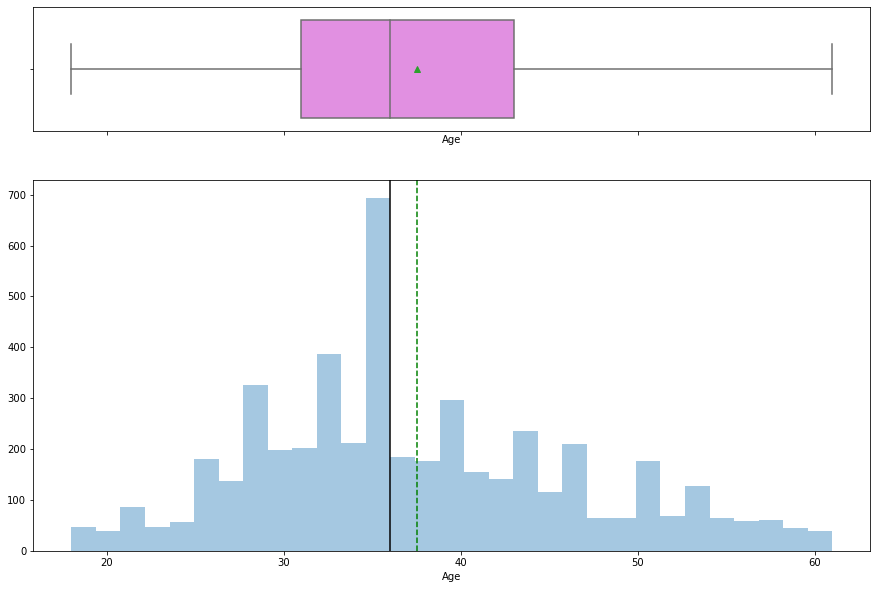

In [36]:
histogram_boxplot(data['Age'])

#### Age is looking normally distributed, with a hint of right skew.

## Observations on CityTier

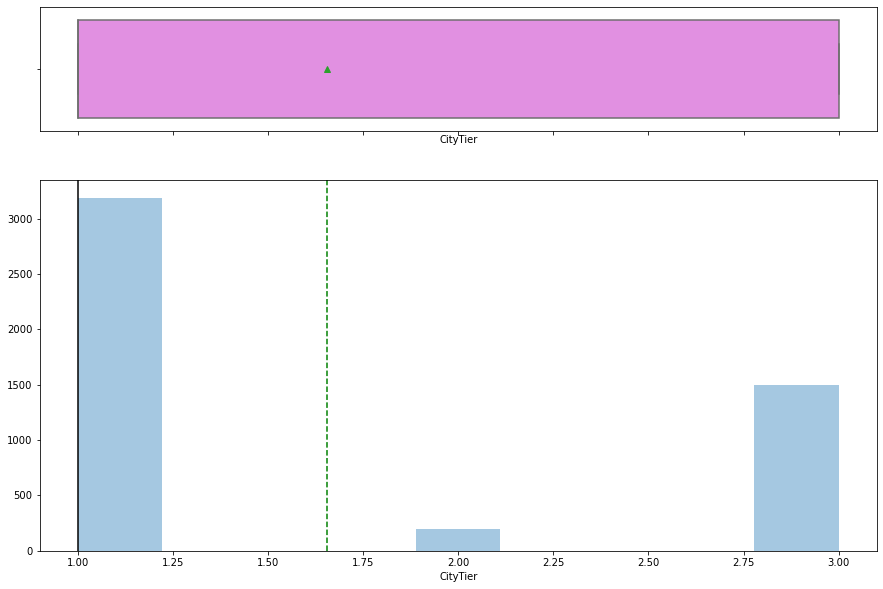

In [37]:
histogram_boxplot(data['CityTier'])

#### Majority of customers from   Tier 1  Citys.










## Observations on DurationOfPitch

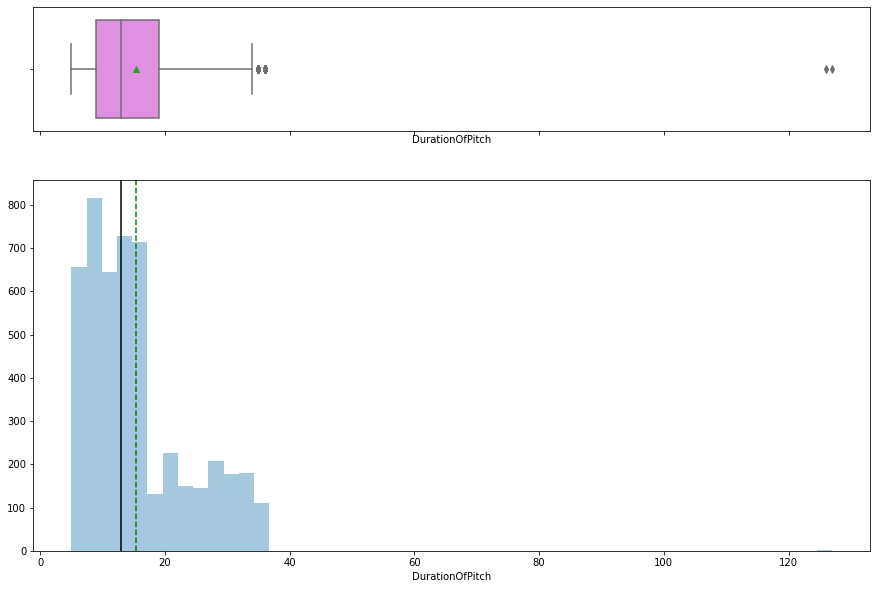

In [38]:
histogram_boxplot(data['DurationOfPitch'])

#### Avg Duration of the pitch by a salesperson to the customer is 15 minutes but there are  two outliers.





## Observations on NumberOfPersonVisiting

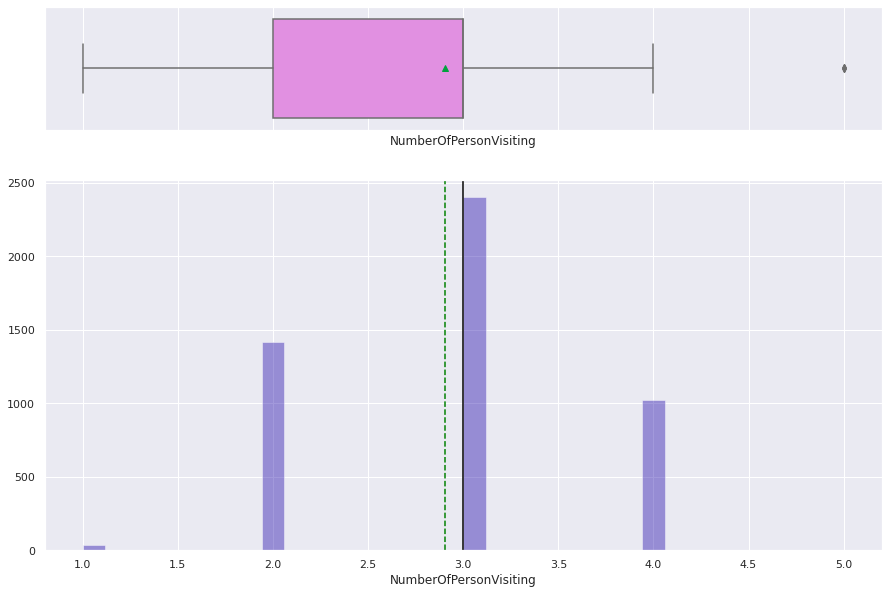

In [ ]:
histogram_boxplot(data['NumberOfPersonVisiting'])

#### Avg NumberOfPersonVisiting is 3






## Observations on NumberOfFollowups

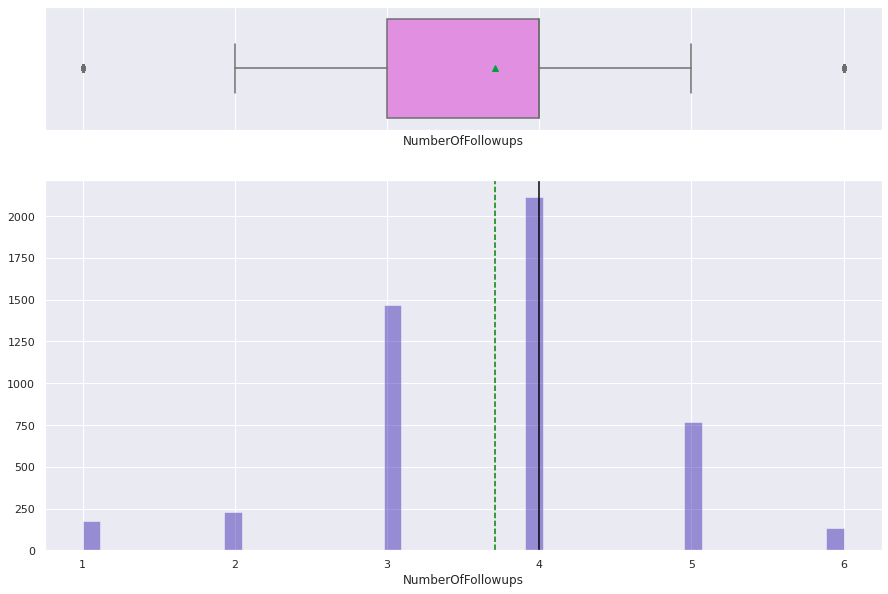

In [ ]:
histogram_boxplot(data['NumberOfFollowups'])

##### NumberOfTrips of the Customer range from 1 to 6 and the average NumberOfFollowups is 4.

## Observations on PreferredPropertyStar

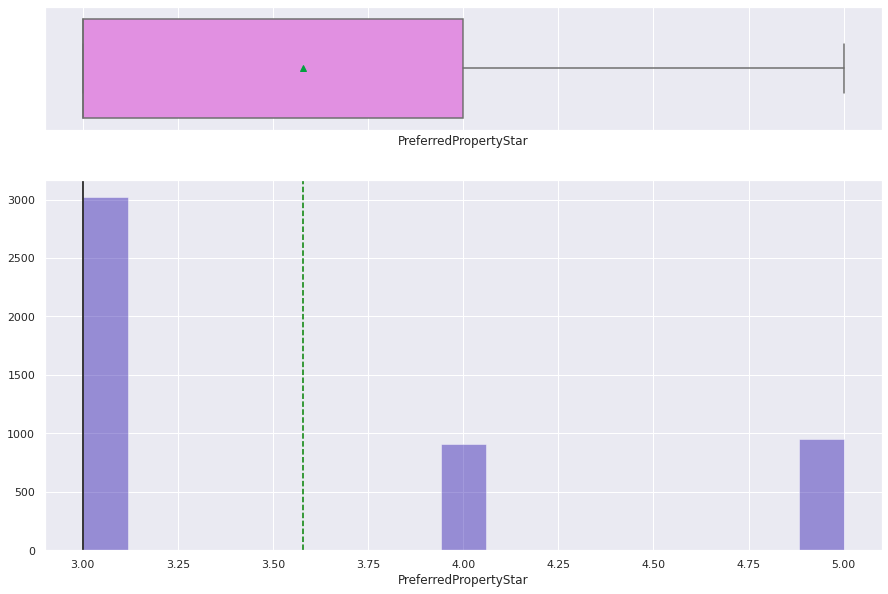

In [ ]:
histogram_boxplot(data['PreferredPropertyStar'])

#### Majority of the Customer have PreferredPropertyStar 3.

## Observations on PitchSatisfactionScore


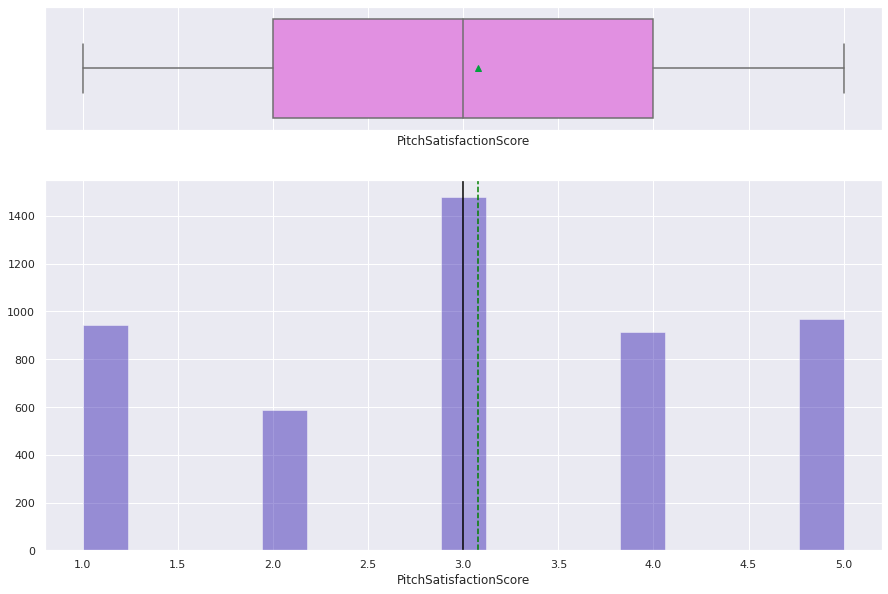

In [ ]:
histogram_boxplot(data['PitchSatisfactionScore'])

#### Majority of the Customer have PreferredPropertyStar 3.

## Observations Passport

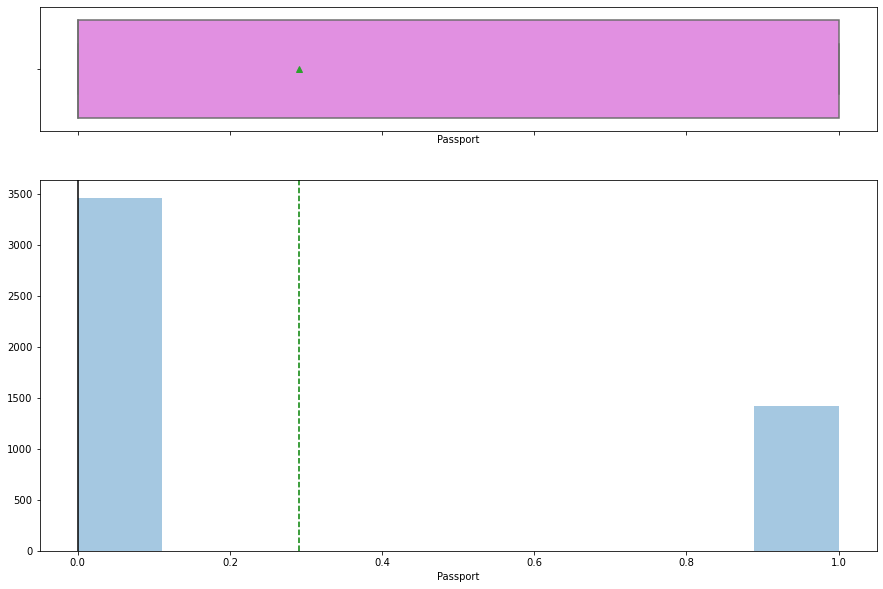

In [9]:
histogram_boxplot(data['Passport'])

## Observations  OwnCar

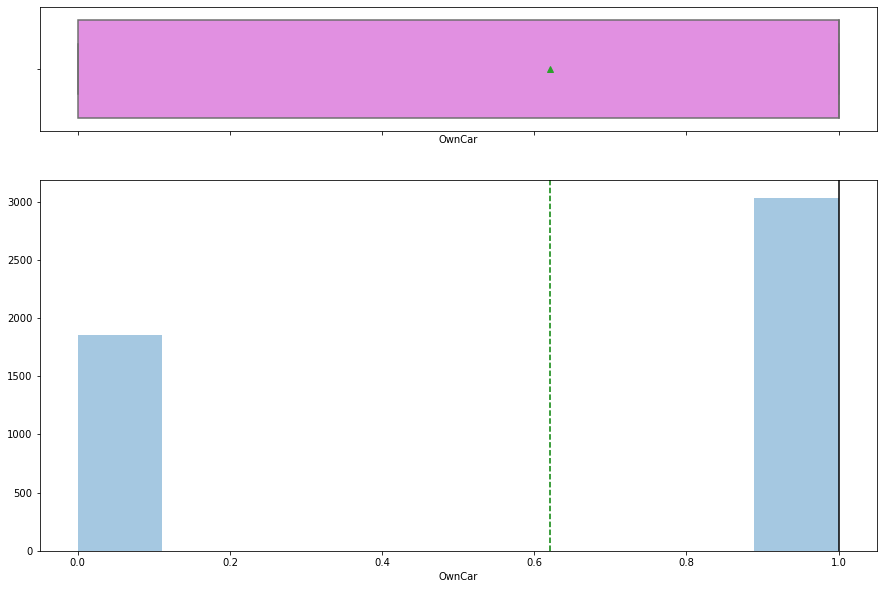

In [10]:
histogram_boxplot(data['OwnCar'])

#### Majority of the Customer have a 1 car.

## Observations on NumberOfChildrenVisiting

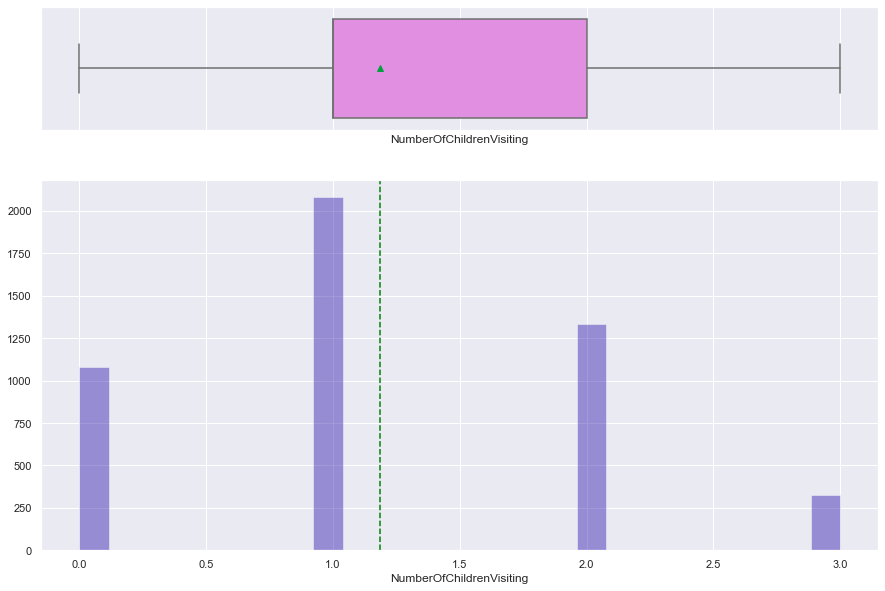

In [49]:
histogram_boxplot(data['NumberOfChildrenVisiting'])

#### Majority of the Customer have a 1 NumberOfChildrenVisiting.

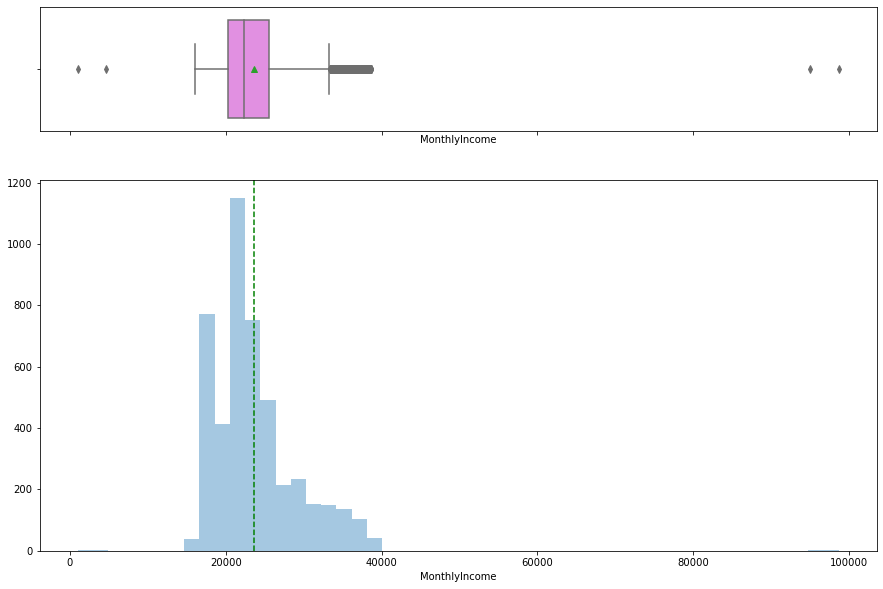

In [12]:
histogram_boxplot(data['MonthlyIncome'])

####  Mean of the MonthlyIncome is approx 23700. 

In [13]:
# Function to create barplots that indicate percentage for each category.

def perc_on_bar(plot, feature):
    '''
    plot
    feature: categorical feature
    the function won't work if a column is passed in hue parameter
    '''

    total = len(feature) # length of the column
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        ax.annotate(percentage, (x, y), size = 12) # annotate the percantage 
        
    plt.show() # show the plot

### Observations on ProdTaken

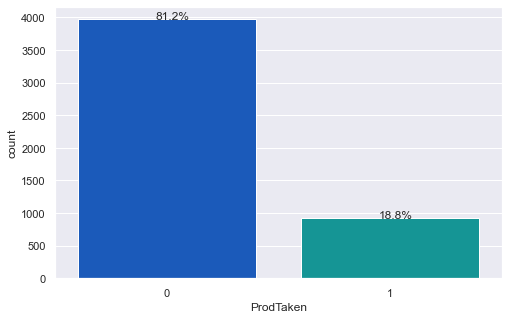

In [53]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["ProdTaken"],palette='winter')
perc_on_bar(ax,data["ProdTaken"])

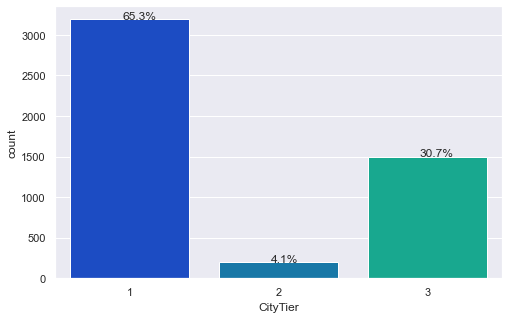

In [54]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["CityTier"],palette='winter')
perc_on_bar(ax,data["CityTier"])

#### Majority of the customers are from Tier 1 cities.

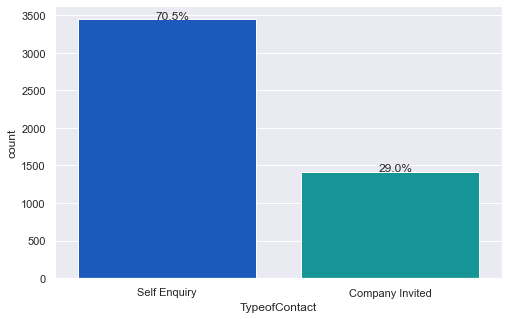

In [55]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["TypeofContact"],palette='winter')
perc_on_bar(ax,data["TypeofContact"])

#### More of the customers are having the TypeofContact with Self Enquiry.

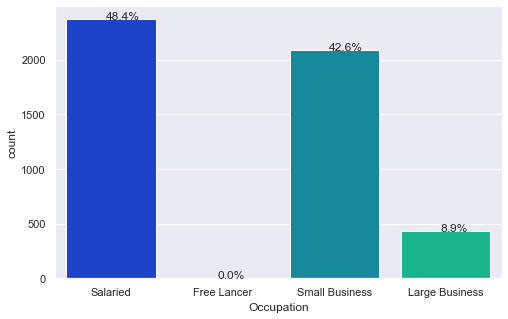

In [56]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["Occupation"],palette='winter')
perc_on_bar(ax,data["Occupation"])

#### Salaried and Small Business are major Occupation.

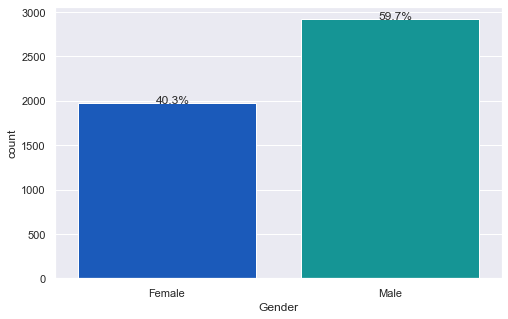

In [72]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["Gender"],palette='winter')
perc_on_bar(ax,data["Gender"])

#### Male customers are more than female

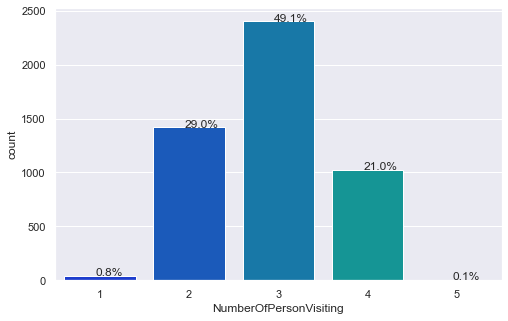

In [68]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["NumberOfPersonVisiting"],palette='winter')
perc_on_bar(ax,data["NumberOfPersonVisiting"])

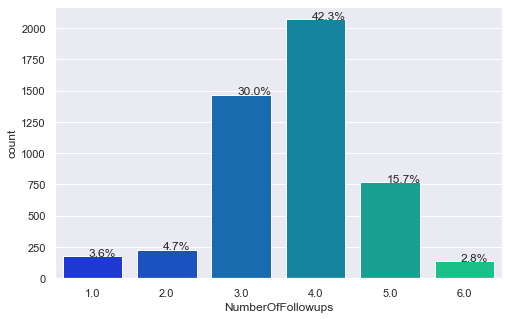

In [59]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["NumberOfFollowups"],palette='winter')
perc_on_bar(ax,data["NumberOfFollowups"])

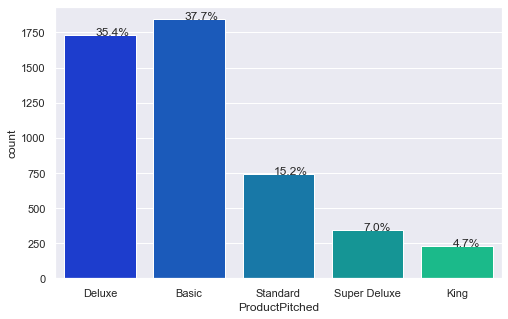

In [60]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["ProductPitched"],palette='winter')
perc_on_bar(ax,data["ProductPitched"])

#### Majority of the Customer prefer the Basic Product

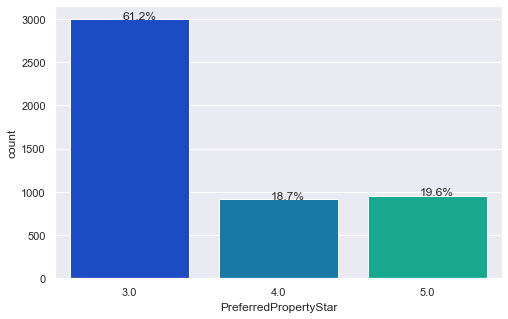

In [61]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["PreferredPropertyStar"],palette='winter')
perc_on_bar(ax,data["PreferredPropertyStar"])

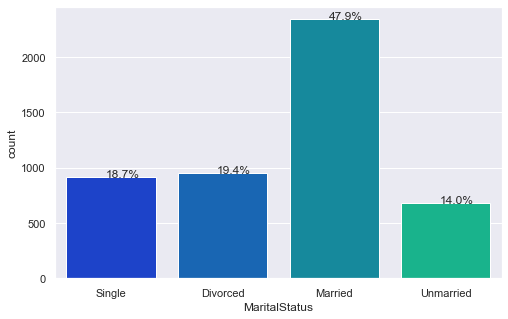

In [62]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["MaritalStatus"],palette='winter')
perc_on_bar(ax,data["MaritalStatus"])

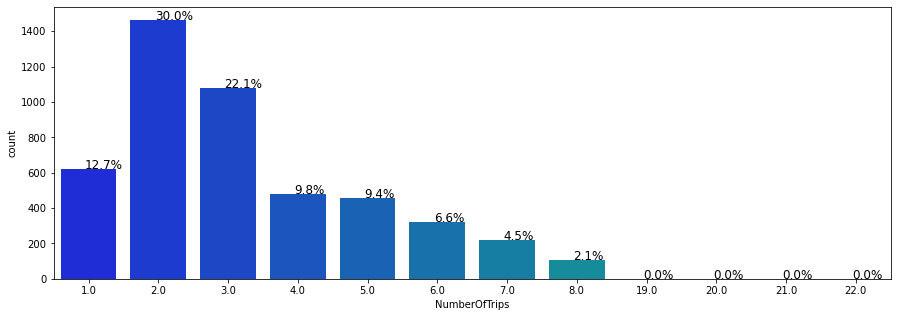

In [24]:
plt.figure(figsize=(15,5))
ax = sns.countplot(data["NumberOfTrips"],palette='winter')
perc_on_bar(ax,data["NumberOfTrips"])

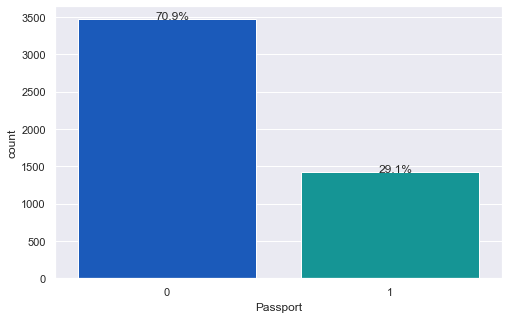

In [63]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["Passport"],palette='winter')
perc_on_bar(ax,data["Passport"])

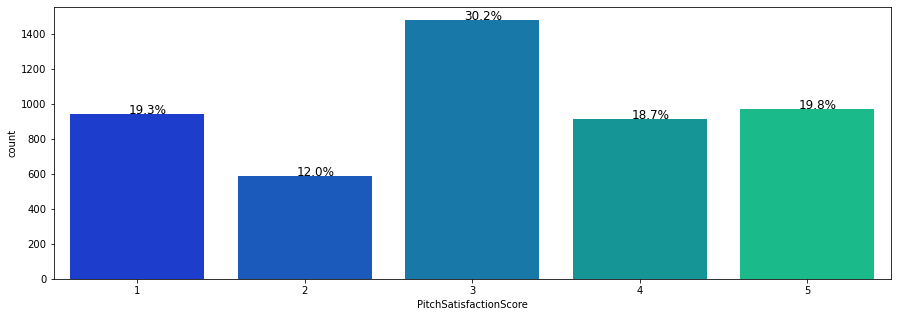

In [26]:
plt.figure(figsize=(15,5))
ax = sns.countplot(data["PitchSatisfactionScore"],palette='winter')
perc_on_bar(ax,data["PitchSatisfactionScore"])

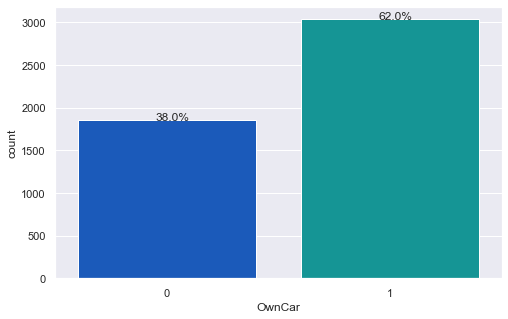

In [64]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["OwnCar"],palette='winter')
perc_on_bar(ax,data["OwnCar"])

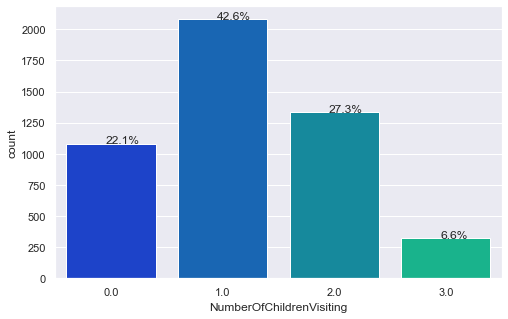

In [65]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["NumberOfChildrenVisiting"],palette='winter')
perc_on_bar(ax,data["NumberOfChildrenVisiting"])

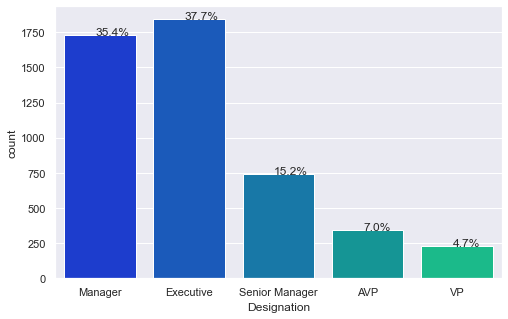

In [66]:
plt.figure(figsize=(8,5))
ax = sns.countplot(data["Designation"],palette='winter')
perc_on_bar(ax,data["Designation"])

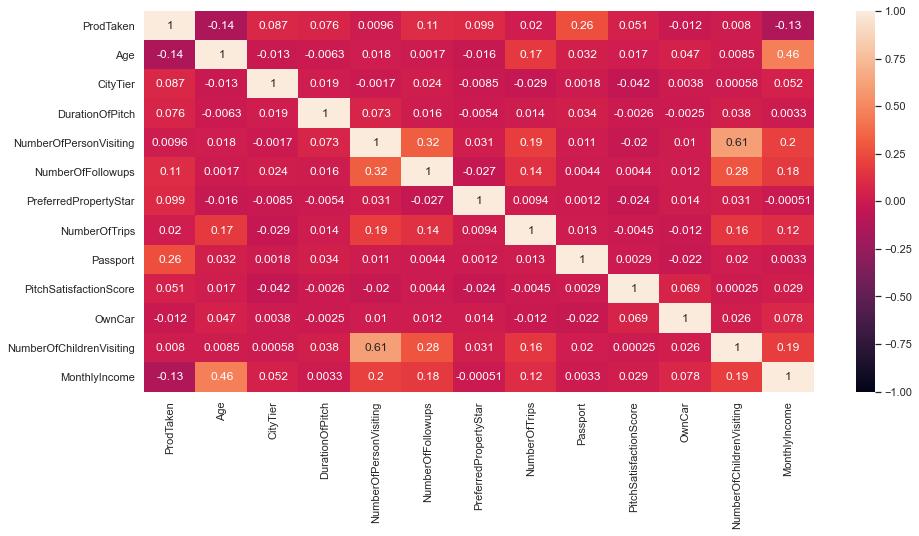

In [89]:
plt.figure(figsize=(15,7))
sns.heatmap(data.corr(),annot=True,vmin=-1,vmax=1)
plt.show()

#### NumberOfChildrenVisiting  and NumberOfPersonVisiting have a strong correlation hence one of these variables can be dropped while model building as they will provide the same information to the model.

#### Monthly Income and Age has a moderate correlation which makes sense as the age increases the spendings might also increase.

#### All other features are very low correlation with each other.

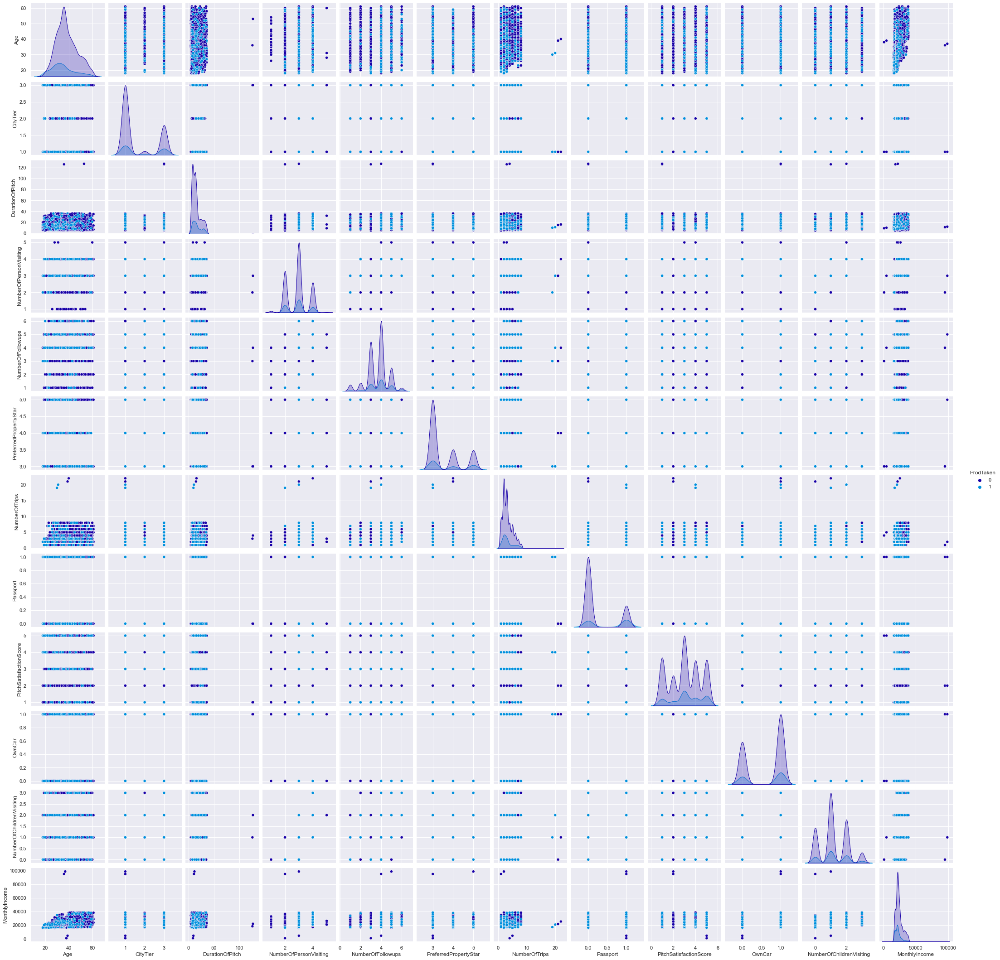

In [91]:
 sns.pairplot(data,hue='ProdTaken')
plt.show()

In [31]:
## Function to plot stacked bar chart
def stacked_plot(x):
    sns.set(palette="nipy_spectral")
    tab1 = pd.crosstab(x, data["ProdTaken"], margins=True)
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(x, data["ProdTaken"], normalize="index")
    tab.plot(kind="bar", stacked=True, figsize=(10, 5))
    plt.legend(loc='lower left', frameon=False)
    plt.legend(loc="upper left", bbox_to_anchor=(0,1))
    plt.show()

ProdTaken           0    1   All
TypeofContact                   
Company Invited  1109  310  1419
Self Enquiry     2837  607  3444
All              3946  917  4863
------------------------------------------------------------------------------------------------------------------------


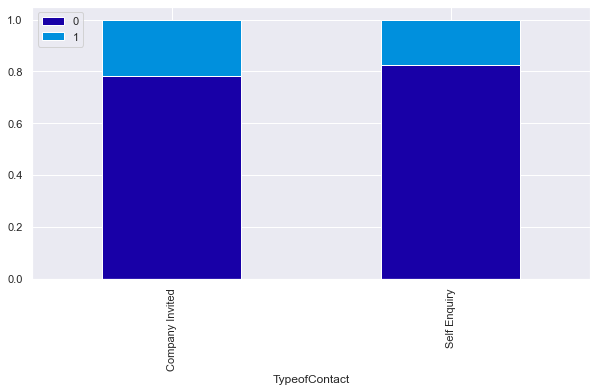

In [32]:
stacked_plot(data["TypeofContact"])

#### Company invited Contact is more  significant on Prod taken compare to self Enquiry

ProdTaken     0    1   All
CityTier                  
1          2670  520  3190
2           152   46   198
3          1146  354  1500
All        3968  920  4888
------------------------------------------------------------------------------------------------------------------------


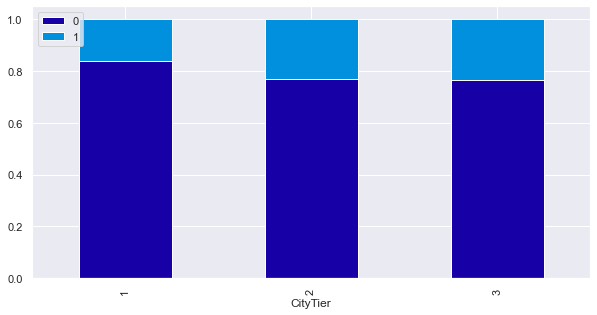

In [33]:
stacked_plot(data["CityTier"])

#### Teir2 and  Teir3 are more significant on Prod taken compare toTeir1

ProdTaken          0    1   All
Occupation                     
Free Lancer        0    2     2
Large Business   314  120   434
Salaried        1954  414  2368
Small Business  1700  384  2084
All             3968  920  4888
------------------------------------------------------------------------------------------------------------------------


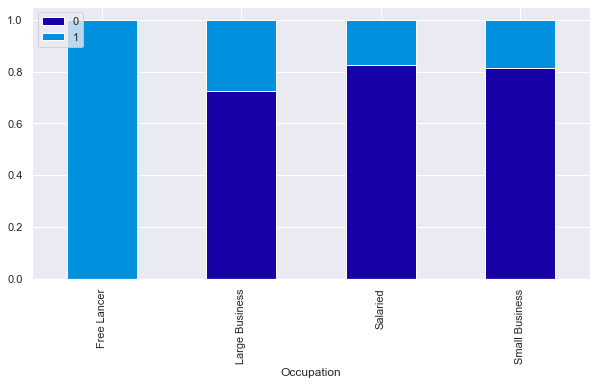

In [35]:
stacked_plot(data["Occupation"])

#### Large Bussiness  is more significant on Prod taken compare to other Occupation.
####   All Free Lancer are taken the product.

ProdTaken     0    1   All
Gender                    
Female     1630  342  1972
Male       2338  578  2916
All        3968  920  4888
------------------------------------------------------------------------------------------------------------------------


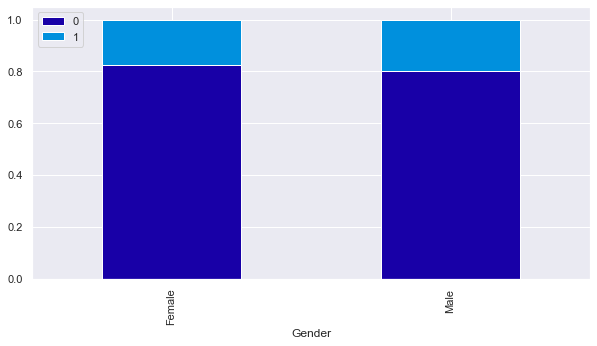

In [73]:
stacked_plot(data["Gender"])

#### There are no significant difference with respect to the Gender on ProdTaken

ProdTaken                  0    1   All
NumberOfPersonVisiting                 
1                         39    0    39
2                       1151  267  1418
3                       1942  460  2402
4                        833  193  1026
5                          3    0     3
All                     3968  920  4888
------------------------------------------------------------------------------------------------------------------------


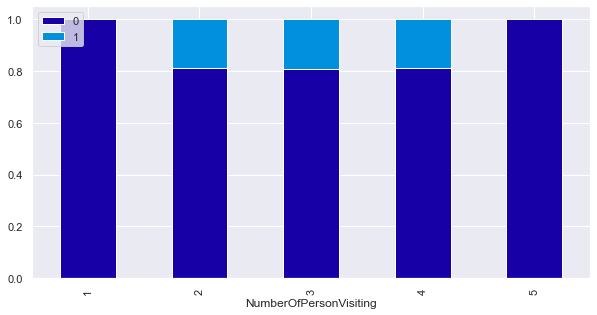

In [38]:
stacked_plot(data["NumberOfPersonVisiting"])

#### Person with 2 to 4 are more significant  on ProdTaken
#### Person with 1 and 5 are not taken the Product.

ProdTaken             0    1   All
NumberOfFollowups                 
1.0                 156   20   176
2.0                 205   24   229
3.0                1222  244  1466
4.0                1689  379  2068
5.0                 577  191   768
6.0                  82   54   136
All                3931  912  4843
------------------------------------------------------------------------------------------------------------------------


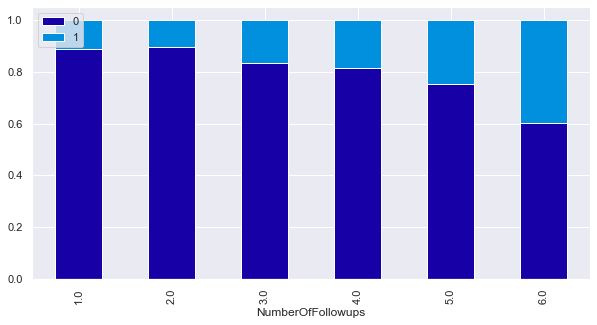

In [39]:
stacked_plot(data["NumberOfFollowups"])

#### More NumberOfFollowups is having big impact on Prod taken compare to less Followups.

ProdTaken          0    1   All
ProductPitched                 
Basic           1290  552  1842
Deluxe          1528  204  1732
King             210   20   230
Standard         618  124   742
Super Deluxe     322   20   342
All             3968  920  4888
------------------------------------------------------------------------------------------------------------------------


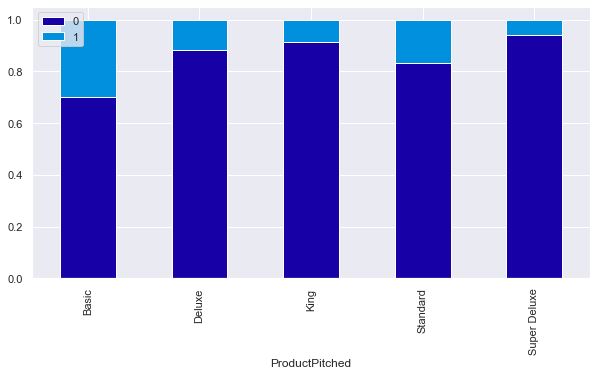

In [77]:
stacked_plot(data["ProductPitched"])

#### Basic product is more significant on Prod taken compare to other Product.

ProdTaken                 0    1   All
PreferredPropertyStar                 
3.0                    2511  482  2993
4.0                     731  182   913
5.0                     706  250   956
All                    3948  914  4862
------------------------------------------------------------------------------------------------------------------------


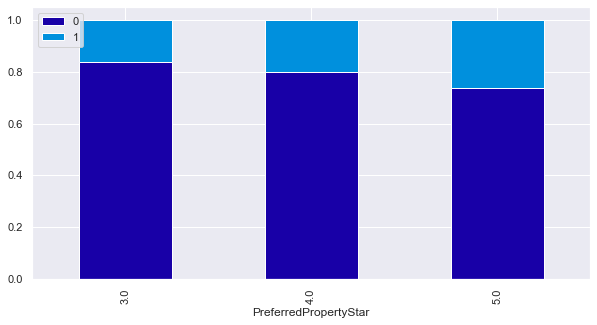

In [40]:
stacked_plot(data["PreferredPropertyStar"])

ProdTaken         0    1   All
MaritalStatus                 
Divorced        826  124   950
Married        2014  326  2340
Single          612  304   916
Unmarried       516  166   682
All            3968  920  4888
------------------------------------------------------------------------------------------------------------------------


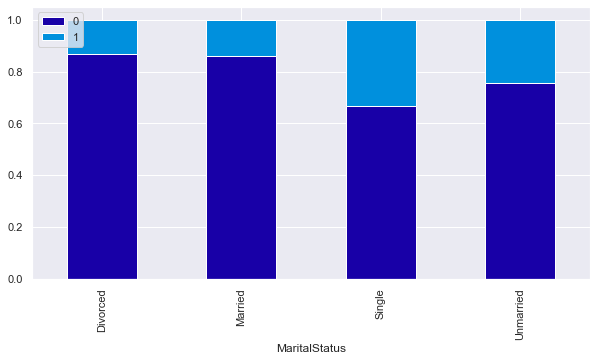

In [41]:
stacked_plot(data["MaritalStatus"])

#### Single person are have more prefered on Prod taken compare to other MaritalStatus.

ProdTaken     0    1   All
Passport                  
0          3040  426  3466
1           928  494  1422
All        3968  920  4888
------------------------------------------------------------------------------------------------------------------------


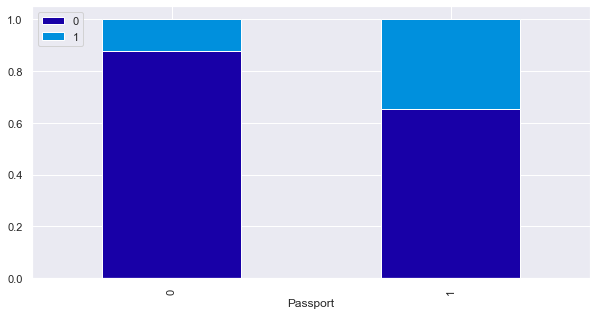

In [42]:
stacked_plot(data["Passport"])

#### Person with Passport have more chance to buy Prod taken compare to without Passport

ProdTaken                  0    1   All
PitchSatisfactionScore                 
1                        798  144   942
2                        498   88   586
3                       1162  316  1478
4                        750  162   912
5                        760  210   970
All                     3968  920  4888
------------------------------------------------------------------------------------------------------------------------


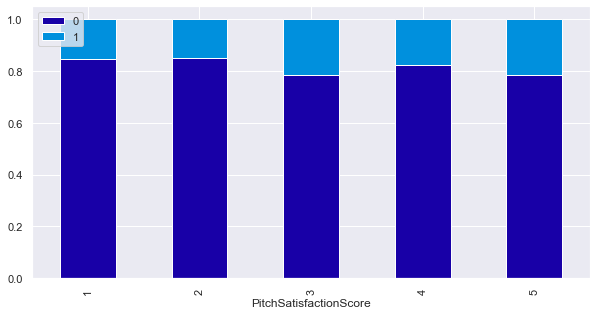

In [43]:
stacked_plot(data["PitchSatisfactionScore"])

#### PitchSatisfactionScore 3 have more chance to buy  Prod taken compare toother Scores.

ProdTaken     0    1   All
OwnCar                    
0          1496  360  1856
1          2472  560  3032
All        3968  920  4888
------------------------------------------------------------------------------------------------------------------------


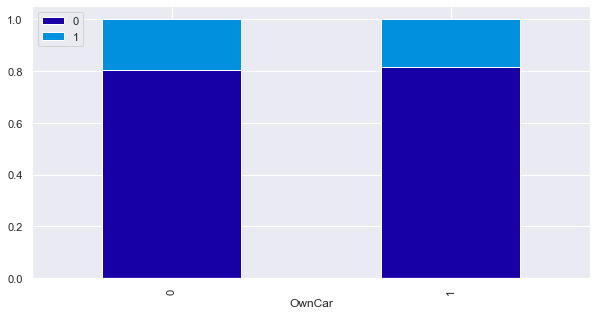

In [44]:
stacked_plot(data["OwnCar"])

#### There are no significant difference with respect to the OwnCar on ProdTaken

ProdTaken                    0    1   All
NumberOfChildrenVisiting                 
0.0                        880  202  1082
1.0                       1688  392  2080
2.0                       1082  253  1335
3.0                        259   66   325
All                       3909  913  4822
------------------------------------------------------------------------------------------------------------------------


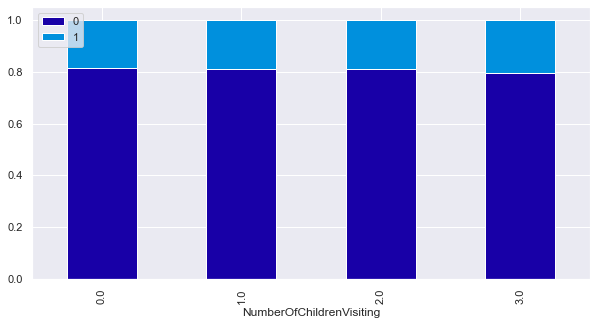

In [45]:
stacked_plot(data["NumberOfChildrenVisiting"])

#### There are no significant difference with respect to the NumberOfChildrenVisiting on ProdTaken

ProdTaken          0    1   All
Designation                    
AVP              322   20   342
Executive       1290  552  1842
Manager         1528  204  1732
Senior Manager   618  124   742
VP               210   20   230
All             3968  920  4888
------------------------------------------------------------------------------------------------------------------------


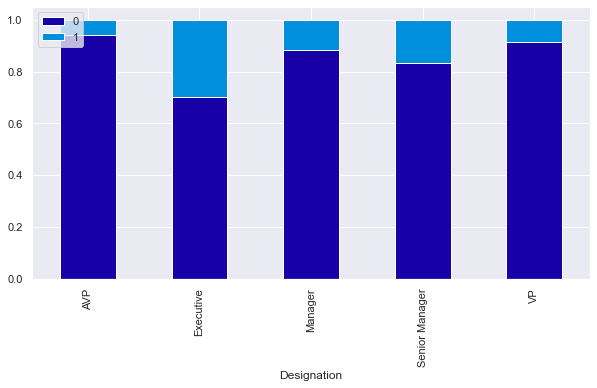

In [46]:
stacked_plot(data["Designation"])

#### Executives have amore chance of buy a Prod  compare to other Designation.
#### AVP  are have less chance to buy a Prod  compare to other Designation.

In [114]:
### Function to plot distributions and Boxplots of customers
def plot(x,target='ProdTaken'):
    fig,axs = plt.subplots(2,2,figsize=(12,10))
    axs[0, 0].set_title('Distribution of a customer with ProdTaken')
    sns.distplot(data[(data[target] == 1)][x],ax=axs[0,0],color='teal')
    axs[0, 1].set_title("Distribution of a customer without ProdTaken")
    sns.distplot(data[(data[target] == 0)][x],ax=axs[0,1],color='orange')
    axs[1,0].set_title('Boxplot w.r.t ProdTaken')
    sns.boxplot(data[target],data[x],ax=axs[1,0],palette='gist_rainbow')
    axs[1,1].set_title('Boxplot w.r.t ProdTaken - Without outliers')
    sns.boxplot(data[target],data[x],ax=axs[1,1],showfliers=False,palette='gist_rainbow')
    plt.tight_layout()
    plt.show()

## ProdTaken vs Age

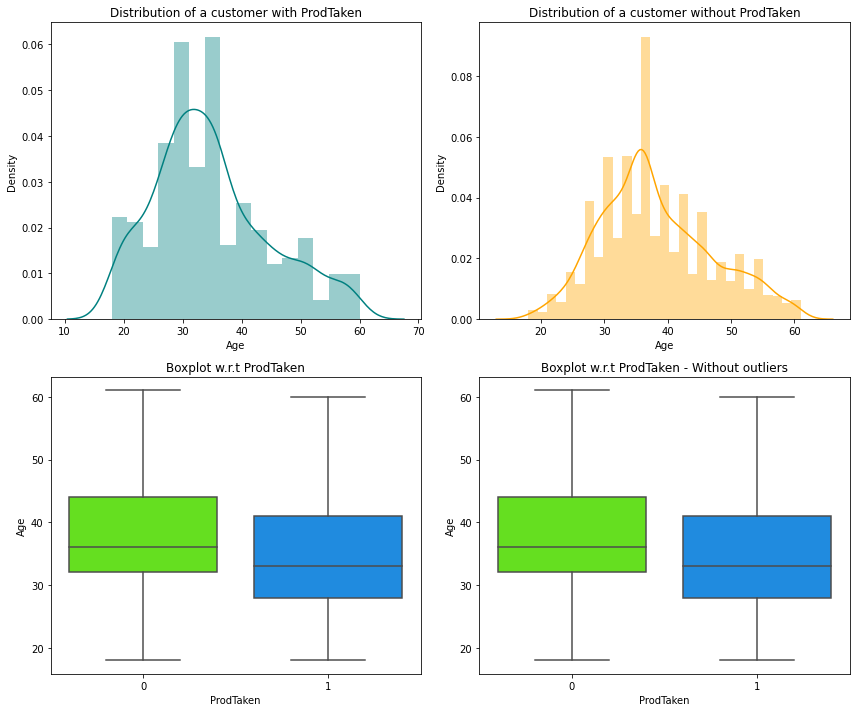

In [115]:
plot('Age')

#### The customers who have taken  the Product have a less  Age than the ones who do not taken  the Product.

## ProdTaken vs MonthlyIncome

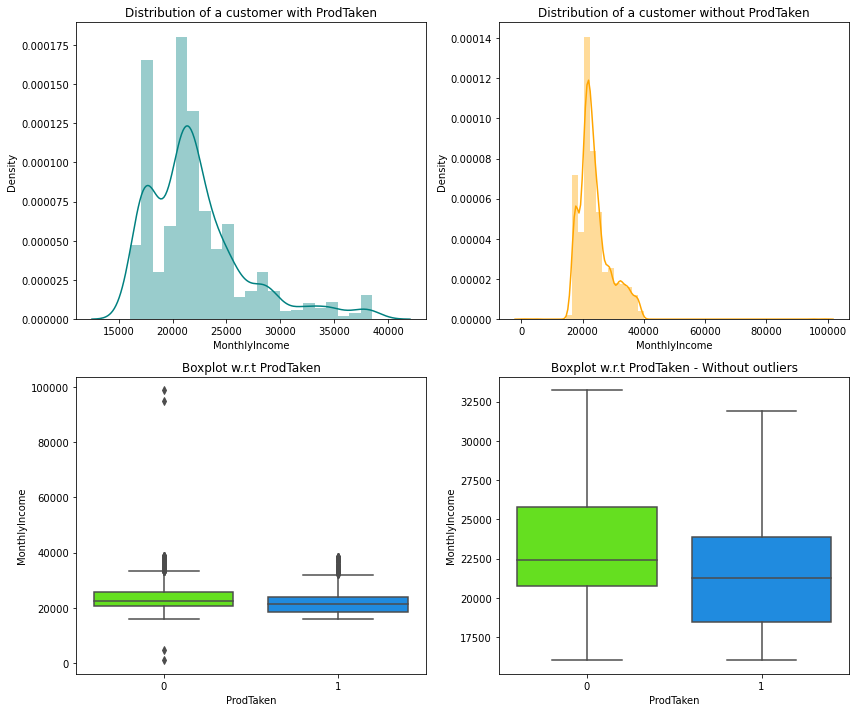

In [116]:
plot('MonthlyIncome')

#### Those customers who have an income higher than 18k-24k dollars are the potential customers who will taken the Prduct.


## ProdTaken vs DurationOfPitch'

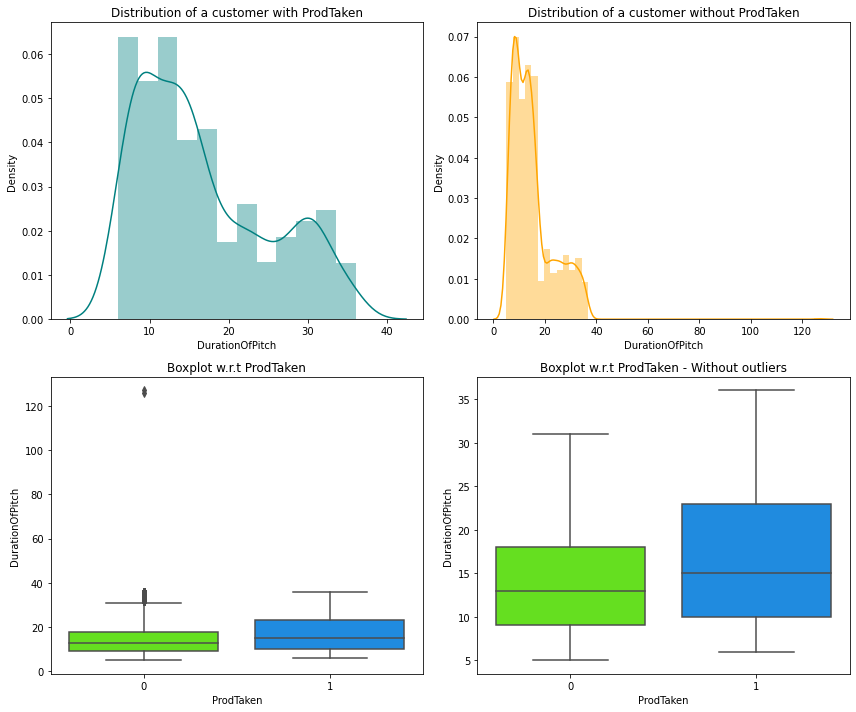

In [118]:
plot('DurationOfPitch')

#### The customers with a DurationOfPitch of greater than15minutes can be the potential customers who opt for Product

## ProdTaken vs NumberOfFollowups'

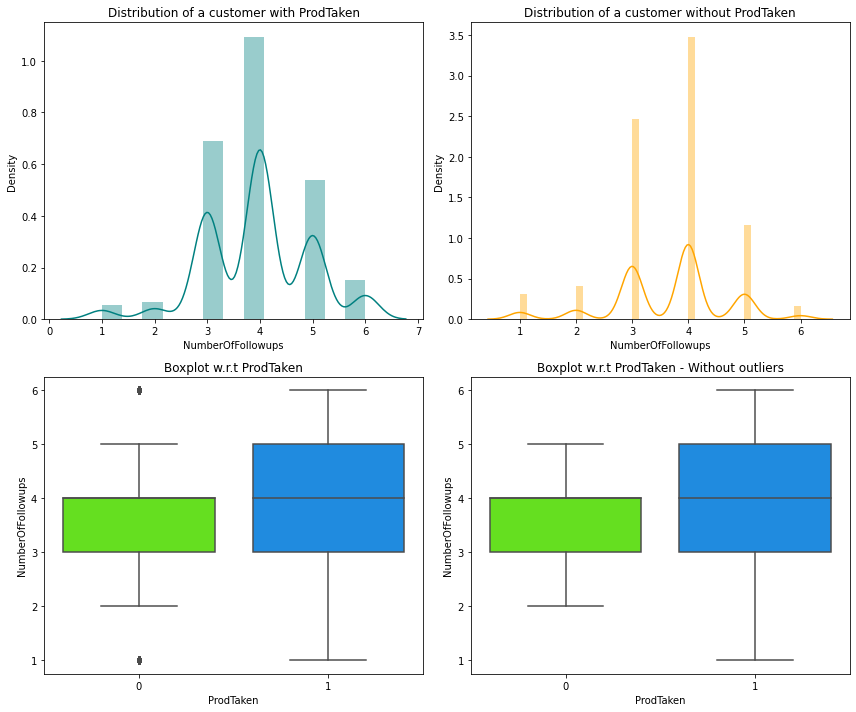

In [120]:
plot('NumberOfFollowups')

#### The customers with a NumberOfFollowups of greater than 4 times can be the potential customers who opt for Product

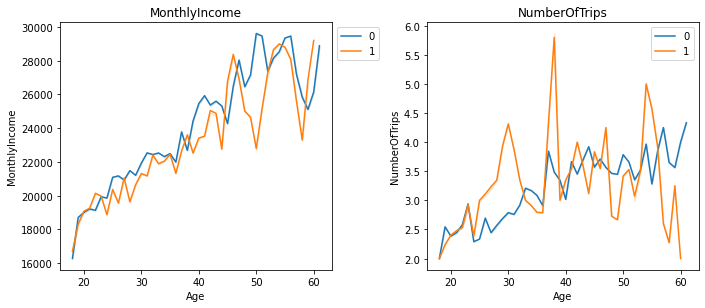

In [121]:
cols = data[['NumberOfFollowups','NumberOfTrips']].columns.tolist()
plt.figure(figsize=(15,12))
for i, variable in enumerate(cols):
                     plt.subplot(3,3,i+1)
                     sns.lineplot(data['Age'],data[variable],hue=data['ProdTaken'],ci=0)
                     plt.tight_layout()
                     plt.title(variable)
                     plt.legend(bbox_to_anchor=(1, 1))

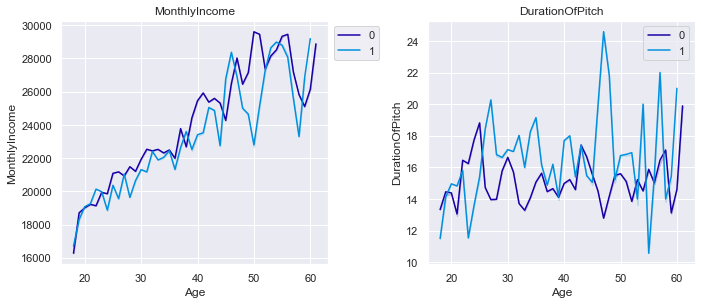

In [92]:
cols = data[['MonthlyIncome','DurationOfPitch']].columns.tolist()
plt.figure(figsize=(15,12))
for i, variable in enumerate(cols):
                     plt.subplot(3,3,i+1)
                     sns.lineplot(data['Age'],data[variable],hue=data['ProdTaken'],ci=0)
                     plt.tight_layout()
                     plt.title(variable)
                     plt.legend(bbox_to_anchor=(1, 1))

# Building the model


## Split Data

When classification problems exhibit a significant imbalance in the distribution of the target classes, it is good to use stratified sampling to ensure that relative class frequencies are approximately preserved in train and test sets.
This is done using the stratify parameter in the train_test_split function.

In [31]:
X = data.drop(['ProdTaken'],axis=1)
X = pd.get_dummies(X,drop_first=True)
y = data['ProdTaken']

X.head()

,Age,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,...,ProductPitched_King,ProductPitched_Standard,ProductPitched_Super Deluxe,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Unmarried,Designation_Executive,Designation_Manager,Designation_Senior Manager,Designation_VP
0,41.0,3,6.0,3,3.0,3.0,1.0,1,2,1,...,0,0,0,0,1,0,0,1,0,0
1,49.0,1,14.0,3,4.0,4.0,2.0,0,3,1,...,0,0,0,0,0,0,0,1,0,0
2,37.0,1,8.0,3,4.0,3.0,7.0,1,3,0,...,0,0,0,0,1,0,1,0,0,0
3,33.0,1,9.0,2,3.0,3.0,2.0,1,5,1,...,0,0,0,0,0,0,1,0,0,0
4,36.0,1,8.0,2,3.0,4.0,1.0,0,5,1,...,0,0,0,0,0,0,1,0,0,0


In [32]:
y.head()

0    1
1    0
2    1
3    0
4    0
Name: ProdTaken, dtype: int64

In [33]:
# Splitting data into training and test set:
X_train, X_test, y_train, y_test =train_test_split(X, y, test_size=0.3, random_state=1,stratify=y)
print(X_train.shape, X_test.shape)

(3421, 28) (1467, 28)


In [34]:
##  Function to calculate recall score
def get_recall_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    a = [] # defining an empty list to store train and test results
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    a.append(train_recall) # adding train recall to list 
    a.append(test_recall) # adding test recall to list
    if flag == True: # If the flag is set to True then only the following print statements will be dispayed
        print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
        print("Recall on test set : ",metrics.recall_score(y_test,pred_test))
    
    return a # returning the list with train and test scores

In [35]:
##  Function to calculate precision score
def get_precision_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    b = []  # defining an empty list to store train and test results
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    b.append(train_precision) # adding train precision to list
    b.append(test_precision) # adding test precision to list
    if flag == True: # If the flag is set to True then only the following print statements will be dispayed
        print("Precision on training set : ",metrics.precision_score(y_train,pred_train))
        print("Precision on test set : ",metrics.precision_score(y_test,pred_test))

    return b # returning the list with train and test scores

In [36]:
##  Function to calculate accuracy score
def get_accuracy_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    c = [] # defining an empty list to store train and test results
    train_acc = model.score(X_train,y_train)
    test_acc = model.score(X_test,y_test)
    c.append(train_acc) # adding train accuracy to list
    c.append(test_acc) # adding test accuracy to list
    if flag == True: # If the flag is set to True then only the following print statements will be dispayed
        print("Accuracy on training set : ",model.score(X_train,y_train))
        print("Accuracy on test set : ",model.score(X_test,y_test))
    
    return c # returning the list with train and test scores

In [37]:
def make_confusion_matrix(model,y_actual,labels=[1, 0]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth  
    
    '''
    y_predict = model.predict(X_test)
    cm=metrics.confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

# Build Decision Tree Model

## Model evaluation criterion



Model can make wrong predictions as: Predicting an Customer will not buy a Product and the Customer will  buy a Product. Predicting Customer will not buy a Product and the Customer will  buy a Product. Which case is more important? Predicting that the Customer will not buy a Product. but he buy i.e. losing on a valuable Customer or asset. How to reduce this loss i.e need to reduce False Negatives? Company wants Recall to be maximized, greater the Recall higher the chances of minimizing false negatives. Hence, the focus should be on increasing Recall or minimizing the false negatives or in other words identifying the true positives(i.e. Class 1) so that the company can provide promote to product to good Customers thereby optimizing the overall project cost in maximising sale. Let's define function to provide metric scores(accuracy,recall and precision) on train and test set and a function to show confusion matrix so that we do not have use the same code repetitively while evaluating models.

## DecisionTreeClassifier

In [38]:
dtree = DecisionTreeClassifier(criterion='gini',class_weight={0:0.19,1:0.81},random_state=1)

DecisionTreeClassifier(class_weight={0: 0.19, 1: 0.81}, random_state=1)

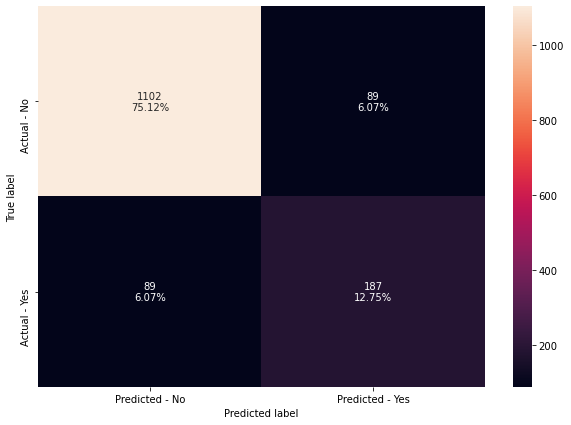

In [40]:
make_confusion_matrix(dtree,y_test)


In [41]:
dtree_acc = get_accuracy_score(dtree)
dtree_recall = get_recall_score(dtree)
dtree_precision = get_precision_score(dtree)

Accuracy on training set :  1.0
Accuracy on test set :  0.8786639400136332
Recall on training set :  1.0
Recall on test set :  0.677536231884058
Precision on training set :  1.0
Precision on test set :  0.677536231884058


##### Decision tree is working well on the training data but is not able to generalize well on the test data concerning the recall.

# Bagging Classifier

In [42]:
bagging = BaggingClassifier(random_state=1)
bagging.fit(X_train,y_train)

BaggingClassifier(random_state=1)

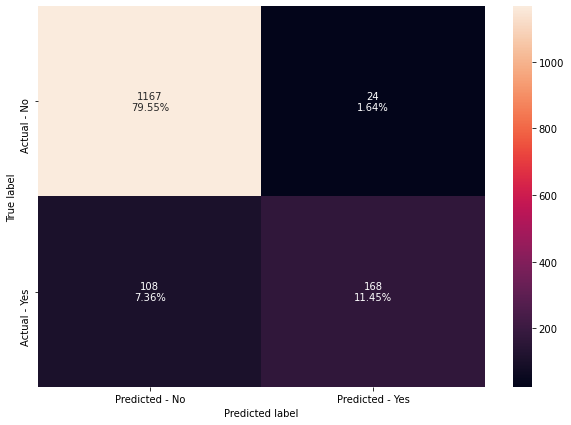

In [43]:
make_confusion_matrix(bagging,y_test)

In [44]:
bagging_acc = get_accuracy_score(bagging)
bagging_recall = get_recall_score(bagging)
bagging_precision = get_precision_score(bagging)

Accuracy on training set :  0.9950306927798889
Accuracy on test set :  0.9100204498977505
Recall on training set :  0.9736024844720497
Recall on test set :  0.6086956521739131
Precision on training set :  1.0
Precision on test set :  0.875


## Bagging Classifier with weighted decision tree

In [45]:
bagging_wt = BaggingClassifier(base_estimator=DecisionTreeClassifier(criterion='gini',class_weight={0:0.15,1:0.85},random_state=1),random_state=1)
bagging_wt.fit(X_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0: 0.15,
                                                                      1: 0.85},
                                                        random_state=1),
                  random_state=1)

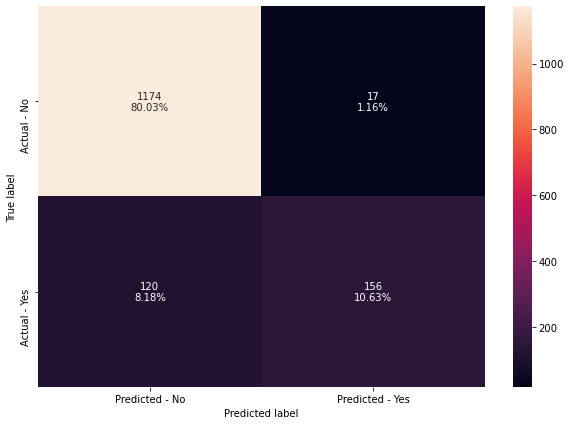

In [46]:
make_confusion_matrix(bagging_wt,y_test)

In [47]:
wt_bagging_acc = get_accuracy_score(bagging_wt)
wt_bagging_recall = get_recall_score(bagging_wt)
wt_bagging_precision = get_precision_score(bagging_wt)

Accuracy on training set :  0.9932768196433791
Accuracy on test set :  0.9066121336059987
Recall on training set :  0.967391304347826
Recall on test set :  0.5652173913043478
Precision on training set :  0.9968
Precision on test set :  0.9017341040462428


##### Bagging classifier with a weighted decision tree is giving very good accuracy and prediction but is not able to generalize well on test data in terms of recall.

# Random Forest

In [48]:
rf = RandomForestClassifier(random_state=1)
rf.fit(X_train,y_train)

RandomForestClassifier(random_state=1)

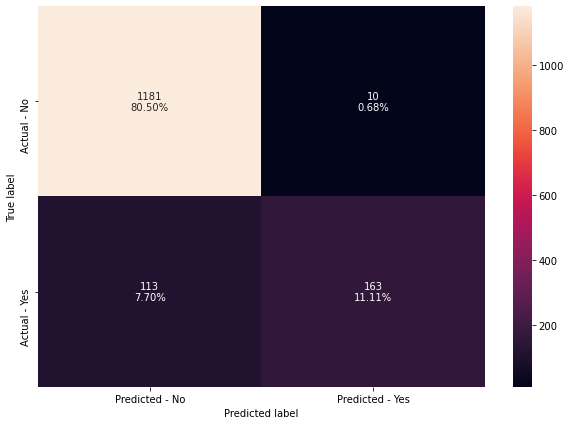

In [49]:
make_confusion_matrix(rf,y_test)

In [50]:
rf_acc = get_accuracy_score(rf)
rf_recall = get_recall_score(rf)
rf_precision = get_precision_score(rf)

Accuracy on training set :  1.0
Accuracy on test set :  0.9161554192229039
Recall on training set :  1.0
Recall on test set :  0.5905797101449275
Precision on training set :  1.0
Precision on test set :  0.9421965317919075


##### Random Forest has performed well in terms of accuracy and precision, but it is not able to generalize well on the test data in terms of recall.

## Random forest with class weights

In [51]:
rf_wt = RandomForestClassifier(class_weight={0:0.13,1:0.87}, random_state=1)
rf_wt.fit(X_train,y_train)

RandomForestClassifier(class_weight={0: 0.13, 1: 0.87}, random_state=1)

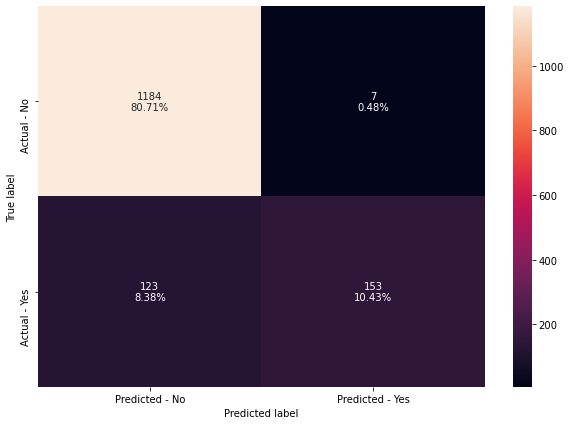

In [52]:
make_confusion_matrix(rf_wt,y_test)

In [53]:
wt_rf_acc = get_accuracy_score(rf_wt)
wt_rf_recall = get_recall_score(rf_wt)
wt_rf_precision = get_precision_score(rf_wt)

Accuracy on training set :  1.0
Accuracy on test set :  0.9113837764144512
Recall on training set :  1.0
Recall on test set :  0.5543478260869565
Precision on training set :  1.0
Precision on test set :  0.95625


## Tuning Models

### Using GridSearch for Hyperparameter tuning model
Hyperparameter tuning is also tricky in the sense that there is no direct way to calculate how a change in the hyperparameter value will reduce the loss of your model, so we usually resort to experimentation. i.e we'll use Grid search
Grid search is a tuning technique that attempts to compute the optimum values of hyperparameters.
It is an exhaustive search that is performed on a the specific parameter values of a model.
The parameters of the estimator/model used to apply these methods are optimized by cross-validated grid-search over a parameter grid.


## Tuning Decision Tree

In [54]:
from sklearn.model_selection import GridSearchCV

In [55]:
# Choose the type of classifier. 
dtree_estimator = DecisionTreeClassifier(class_weight={0:0.20,1:0.80},random_state=1)

# Grid of parameters to choose from
parameters = {'max_depth': np.arange(2,10), 
              'min_samples_leaf': [1, 2, 5, 7, 10],
              'max_leaf_nodes' : [2, 3, 5, 10,15],
              'min_impurity_decrease': [0.0001,0.001,0.01,0.1]
             }

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(dtree_estimator, parameters, scoring=scorer)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
dtree_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
dtree_estimator.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.2, 1: 0.8}, max_depth=6,
                       max_leaf_nodes=15, min_impurity_decrease=0.0001,
                       random_state=1)

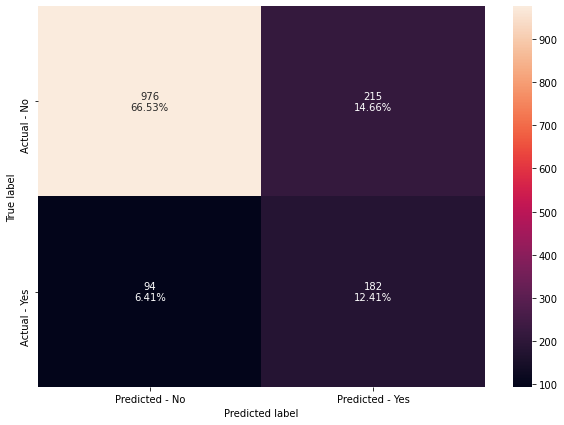

In [56]:
make_confusion_matrix(dtree_estimator,y_test)

In [57]:
tuned_dtree_acc = get_accuracy_score(dtree_estimator)
tuned_dtree_recall = get_recall_score(dtree_estimator)
tuned_dtree_precision = get_precision_score(dtree_estimator)

Accuracy on training set :  0.779888921368021
Accuracy on test set :  0.7893660531697342
Recall on training set :  0.6490683229813664
Recall on test set :  0.6594202898550725
Precision on training set :  0.44232804232804235
Precision on test set :  0.45843828715365237


# Tuning Bagging Classifier

In [58]:
# grid search for bagging classifier
cl1 = DecisionTreeClassifier(class_weight={0:0.20,1:0.80},random_state=1)
param_grid = {'base_estimator':[cl1],
              'n_estimators':[5,7,15,51,101],
              'max_features': [0.7,0.8,0.9,1]
             }

grid = GridSearchCV(BaggingClassifier(random_state=1,bootstrap=True), param_grid=param_grid, scoring = 'recall', cv = 5)
grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=BaggingClassifier(random_state=1),
             param_grid={'base_estimator': [DecisionTreeClassifier(class_weight={0: 0.2,
                                                                                 1: 0.8},
                                                                   random_state=1)],
                         'max_features': [0.7, 0.8, 0.9, 1],
                         'n_estimators': [5, 7, 15, 51, 101]},
             scoring='recall')

In [59]:
## getting the best estimator
bagging_estimator  = grid.best_estimator_
bagging_estimator.fit(X_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0: 0.2,
                                                                      1: 0.8},
                                                        random_state=1),
                  max_features=0.8, n_estimators=101, random_state=1)

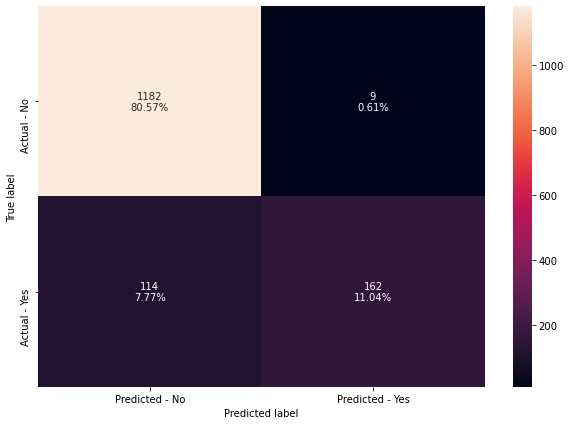

In [60]:
make_confusion_matrix(bagging_estimator,y_test)

In [61]:
tuned_bagging_acc= get_accuracy_score(bagging_estimator)
tuned_bagging_recall = get_recall_score(bagging_estimator)
tuned_bagging_precision = get_precision_score(bagging_estimator)

Accuracy on training set :  1.0
Accuracy on test set :  0.9161554192229039
Recall on training set :  1.0
Recall on test set :  0.5869565217391305
Precision on training set :  1.0
Precision on test set :  0.9473684210526315


## Tuning Random Forest

In [62]:
# Choose the type of classifier. 
rf_estimator = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {  
        "n_estimators": [110,201,300],
        "min_samples_leaf": np.arange(1,6,1),
        "max_features": [0.7,0.9,'log2','auto'],
        "max_samples": [0.7,0.9,None],
}


# Run the grid search
grid_obj = GridSearchCV(rf_estimator, parameters, scoring='recall',cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
rf_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
rf_estimator.fit(X_train, y_train)

RandomForestClassifier(max_features=0.7, n_estimators=110, random_state=1)

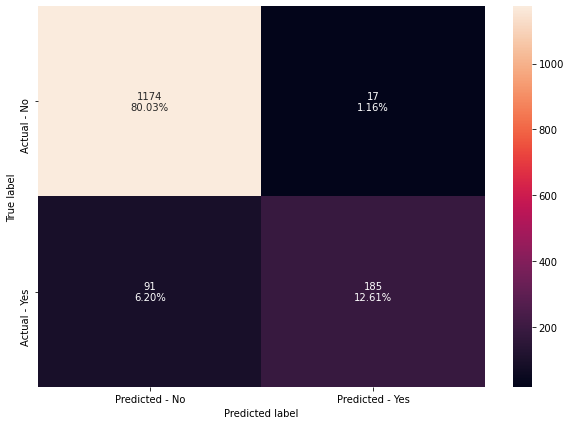

In [63]:
make_confusion_matrix(rf_estimator,y_test)

In [64]:
tuned_rf_acc = get_accuracy_score(rf_estimator)
tuned_rf_recall = get_recall_score(rf_estimator)
tuned_rf_precision = get_precision_score(rf_estimator)

Accuracy on training set :  1.0
Accuracy on test set :  0.9263803680981595
Recall on training set :  1.0
Recall on test set :  0.6702898550724637
Precision on training set :  1.0
Precision on test set :  0.9158415841584159


# Comparing all the models¶

In [65]:
# defining list of models
models = [dtree,dtree_estimator,bagging,bagging_wt,bagging_estimator,rf,rf_wt,rf_estimator]
# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []

# looping through all the models to get the accuracy,recall and precision scores
for model in models:
    # accuracy score
    j = get_accuracy_score(model,False)
    acc_train.append(j[0])
    acc_test.append(j[1])
    # recall score
    k = get_recall_score(model,False)
    recall_train.append(k[0])
    recall_test.append(k[1])
    # precision score
    l = get_precision_score(model,False)
    precision_train.append(l[0])
    precision_test.append(l[1])

In [66]:
comparison_frame = pd.DataFrame({'Model':['Decision Tree','Tuned Decision Tree','Bagging Classifier',
                                          'Weighted Bagging Classifier','Tuned Bagging Classifier',
                                          'Random Forest','Weighted Random Forest','Tuned Random Forest'], 
                                          'Train_Accuracy': acc_train,
                                          'Test_Accuracy': acc_test,
                                          'Train_Recall': recall_train,
                                          'Test_Recall': recall_test,
                                          'Train_Precision': precision_train,
                                          'Test_Precision': precision_test}) 
comparison_frame

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision
0,Decision Tree,1.000000,0.878664,1.000000,0.677536,1.000000,0.677536
1,Tuned Decision Tree,0.779889,0.789366,0.649068,0.659420,0.442328,0.458438
2,Bagging Classifier,0.995031,0.910020,0.973602,0.608696,1.000000,0.875000
3,Weighted Bagging Classifier,0.993277,0.906612,0.967391,0.565217,0.996800,0.901734
4,Tuned Bagging Classifier,1.000000,0.916155,1.000000,0.586957,1.000000,0.947368
5,Random Forest,1.000000,0.916155,1.000000,0.590580,1.000000,0.942197
6,Weighted Random Forest,1.000000,0.911384,1.000000,0.554348,1.000000,0.956250
7,Tuned Random Forest,1.000000,0.926380,1.000000,0.670290,1.000000,0.915842


#### Decision tree performed well on training and test set.
Bagging classifier overfitted the data before and after tuning.
Random Forest with default parameters performed same as after tuning - As the final results depend on the parameters used/checked using GridSearchCV, There may be yet better parameters which may result in a better performance.

## Feature importance of Random Forest

In [67]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(rf.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

                                  Imp
MonthlyIncome                0.129536
Age                          0.122191
DurationOfPitch              0.100428
Passport                     0.069398
NumberOfTrips                0.064524
PitchSatisfactionScore       0.056655
NumberOfFollowups            0.055707
PreferredPropertyStar        0.042556
CityTier                     0.036494
Designation_Executive        0.030650
NumberOfChildrenVisiting     0.030453
NumberOfPersonVisiting       0.028751
MaritalStatus_Single         0.027011
TypeofContact_Self Enquiry   0.025111
Gender_Male                  0.024934
OwnCar                       0.021215
Occupation_Small Business    0.019738
Occupation_Salaried          0.019421
MaritalStatus_Married        0.017482
MaritalStatus_Unmarried      0.016705
Occupation_Large Business    0.016277
Designation_Manager          0.010487
ProductPitched_Deluxe        0.009446
Designation_Senior Manager   0.007590
ProductPitched_Standard      0.007488
ProductPitch

In [68]:
feature_names = X_train.columns

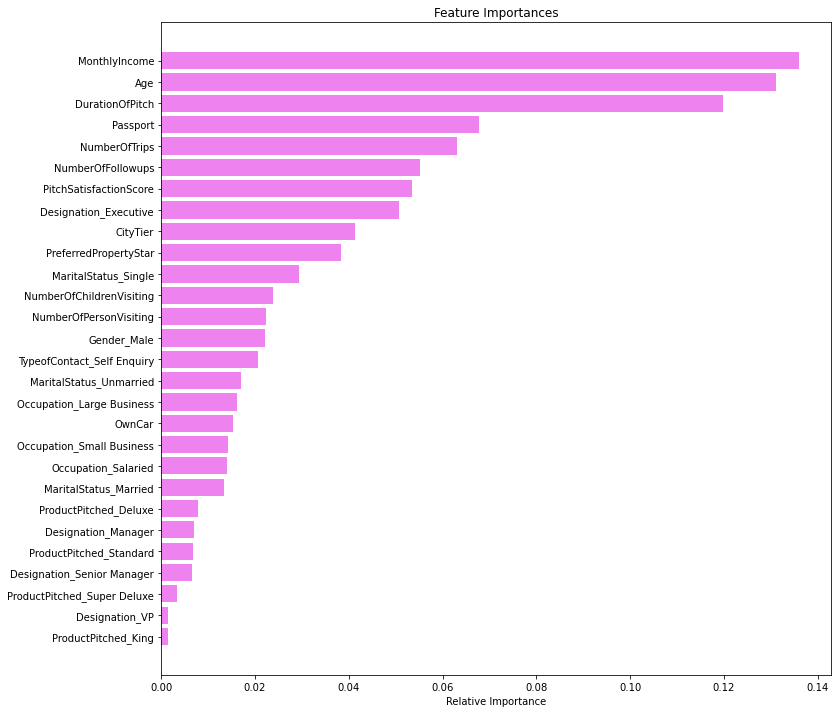

In [69]:
importances = rf_estimator.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

# Building the model using Boosting



### We are going to build 3 ensemble models here - AdaBoost Classifier, Gradient Boosting Classifier and XGBoost Classifier.
#### First, let's build these models with default parameters and then use hyperparameter tuning to optimize the model performance.
#### We will calculate all three metrics - Accuracy, Precision and Recall but the metric of interest here is recall.
#### Recall - It gives the ratio of True positives to Actual positives, so high Recall implies low false negatives, i.e. more customers those purchased the newly introduced travel package.



##  AdaBoost Classifier

In [70]:
abc = AdaBoostClassifier(random_state=1)
abc.fit(X_train,y_train)

AdaBoostClassifier(random_state=1)

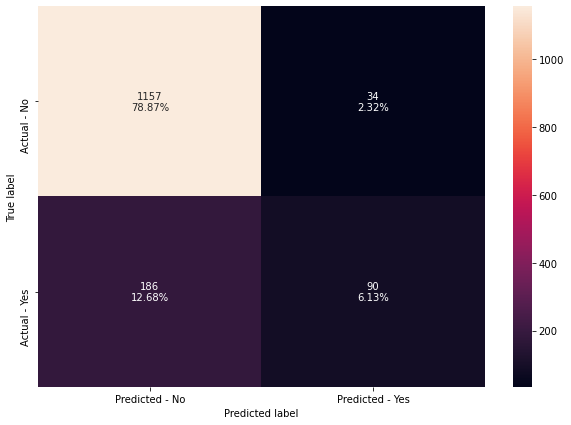

In [71]:
make_confusion_matrix(abc,y_test)

In [72]:
##  Function to calculate different metric scores of the model - Accuracy, Recall and Precision
def get_metrics_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    score_list=[] 
    
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    train_acc = model.score(X_train,y_train)
    test_acc = model.score(X_test,y_test)
    
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision))
        
    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",model.score(X_train,y_train))
        print("Accuracy on test set : ",model.score(X_test,y_test))
        print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
        print("Recall on test set : ",metrics.recall_score(y_test,pred_test))
        print("Precision on training set : ",metrics.precision_score(y_train,pred_train))
        print("Precision on test set : ",metrics.precision_score(y_test,pred_test))
    
    return score_list # returning the list with train and test scores

In [73]:
#Using above defined function to get accuracy, recall and precision on train and test set
abc_score=get_metrics_score(abc)

Accuracy on training set :  0.844489915229465
Accuracy on test set :  0.8500340831629175
Recall on training set :  0.31832298136645965
Recall on test set :  0.32608695652173914
Precision on training set :  0.6879194630872483
Precision on test set :  0.7258064516129032


### AdaBoost Classifier decision tree is giving  ok with  accuracy and prediction but is not able to generalize well on test data in terms of recall.

# Gradient Boosting Classifier

In [74]:
gbc = GradientBoostingClassifier(random_state=1)
gbc.fit(X_train,y_train)

GradientBoostingClassifier(random_state=1)

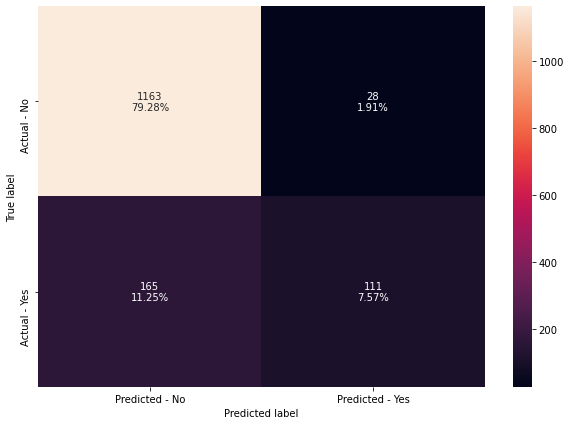

In [75]:
make_confusion_matrix(gbc,y_test)

In [76]:
#Using above defined function to get accuracy, recall and precision on train and test set
gbc_score=get_metrics_score(gbc)

Accuracy on training set :  0.8830751242326805
Accuracy on test set :  0.8684389911383776
Recall on training set :  0.43788819875776397
Recall on test set :  0.40217391304347827
Precision on training set :  0.88125
Precision on test set :  0.7985611510791367


### Gradient Boosting Classifier with  decision tree is giving ok with accuracy and prediction but is not able to generalize well on test data in terms of recall.

# XGBoost Classifier

In [77]:
xgb = XGBClassifier(random_state=1)
xgb.fit(X_train,y_train)

[19:42:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1, random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

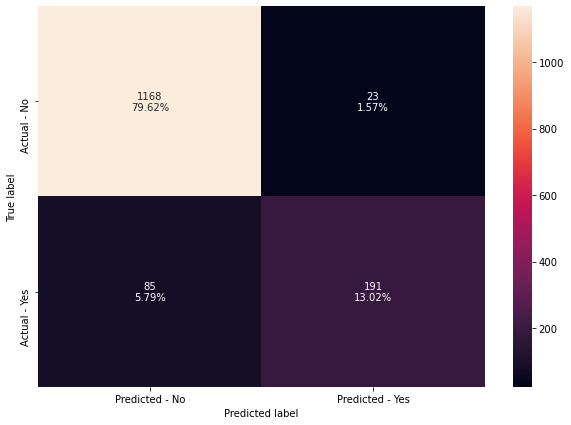

In [78]:
make_confusion_matrix(xgb,y_test)

In [79]:
#Using above defined function to get accuracy, recall and precision on train and test set
xgb_score=get_metrics_score(xgb)

Accuracy on training set :  0.9997076878105817
Accuracy on test set :  0.9263803680981595
Recall on training set :  0.9984472049689441
Recall on test set :  0.6920289855072463
Precision on training set :  1.0
Precision on test set :  0.8925233644859814


### XGBoost Classifier  is giving very good accuracy and prediction but is generalize well on test data in terms of recall.

# Hyperparameter Tuning


##  AdaBoost Classifier

### An AdaBoost classifier is a meta-estimator that begins by fitting a classifier on the original dataset and then fits additional copies of the classifier on the same dataset but where the weights of incorrectly classified instances are adjusted such that subsequent classifiers focus more on difficult cases.
### Some important hyperparamters are:
### base_estimator: The base estimator from which the boosted ensemble is built. By default the base estimator is a decision tree with max_depth=1
### n_estimators: The maximum number of estimators at which boosting is terminated. Default value is 50.
### learning_rate: Learning rate shrinks the contribution of each classifier by learning_rate. There is a trade-off between learning_rate and n_estimators.

In [80]:
# Choose the type of classifier. 
abc_tuned = AdaBoostClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    #Let's try different max_depth for base_estimator
    "base_estimator":[DecisionTreeClassifier(max_depth=1),DecisionTreeClassifier(max_depth=2),DecisionTreeClassifier(max_depth=3)],
    "n_estimators": np.arange(10,60,5),
    "learning_rate":np.arange(0.1,2,0.1)
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(abc_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
abc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
abc_tuned.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3),
                   learning_rate=1.6, n_estimators=55, random_state=1)

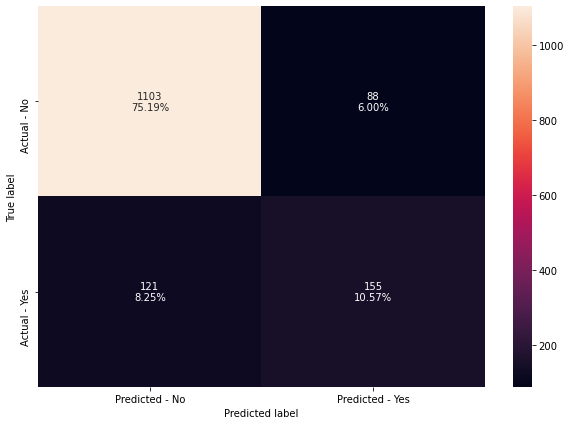

In [81]:
make_confusion_matrix(abc_tuned,y_test)

In [82]:
#Using above defined function to get accuracy, recall and precision on train and test set
abc_tuned_score=get_metrics_score(abc_tuned)

Accuracy on training set :  0.9412452499269219
Accuracy on test set :  0.8575323790047716
Recall on training set :  0.8043478260869565
Recall on test set :  0.5615942028985508
Precision on training set :  0.8735244519392917
Precision on test set :  0.6378600823045267


### Insights
#### The model is overfitting the train data as train accuracy is much higher than the test accuracy.
#### The model has low test recall. This implies that the model is not good at identifying customers those purchased the newly introduced travel package.

## Gradient Boosting Classifier
Most of the hyperparameters available are same as random forest classifier.
init: An estimator object that is used to compute the initial predictions. If ‘zero’, the initial raw predictions are set to zero. By default, a DummyEstimator predicting the classes priors is used.
There is no class_weights parameter in gradient boosting.
### Let's try using AdaBoost classifier as the estimator for initial predictions

In [84]:
gbc_init = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)
gbc_init.fit(X_train,y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           random_state=1)

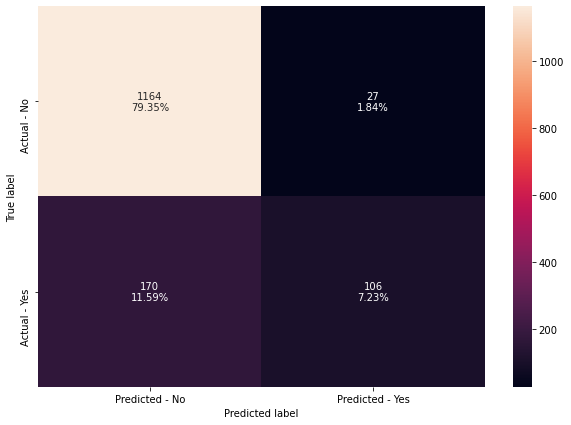

In [86]:
make_confusion_matrix(gbc_init,y_test)

In [85]:
#Using above defined function to get accuracy, recall and precision on train and test set
gbc_init_score=get_metrics_score(gbc_init)

Accuracy on training set :  0.8865828705057001
Accuracy on test set :  0.8657123381049762
Recall on training set :  0.4518633540372671
Recall on test set :  0.38405797101449274
Precision on training set :  0.8926380368098159
Precision on test set :  0.7969924812030075


### As compared to the model with default parameters:

Test accuracy and test recall have increased slightly.
As we are getting better results, we will use init = AdaBoostClassifier() to tune the gradient boosting model.

In [87]:
# Choose the type of classifier. 
gbc_tuned = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "n_estimators": [100,150,200,250],
    "subsample":[0.8,0.9,1],
    "max_features":[0.7,0.8,0.9,1]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(gbc_tuned, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
gbc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
gbc_tuned.fit(X_train, y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_features=0.9, n_estimators=250, random_state=1,
                           subsample=0.8)

In [88]:
#Using above defined function to get accuracy, recall and precision on train and test set
gbc_tuned_score=get_metrics_score(gbc_tuned)

Accuracy on training set :  0.9196141479099679
Accuracy on test set :  0.8841172460804363
Recall on training set :  0.6118012422360248
Recall on test set :  0.4891304347826087
Precision on training set :  0.9403341288782816
Precision on test set :  0.823170731707317


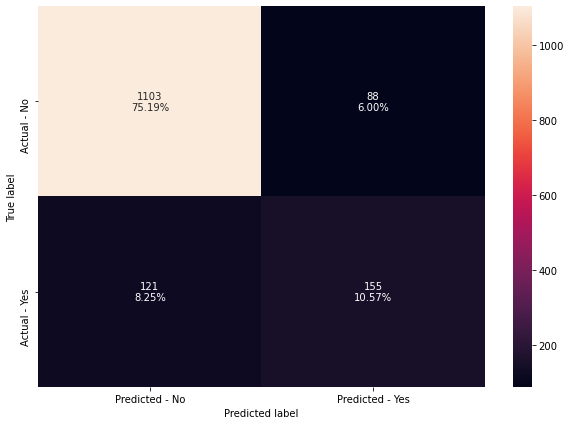

In [89]:
make_confusion_matrix(abc_tuned,y_test)

## Insights
### The model performace has not increased by much.
### The model has started to overfit the train data in terms of recall.
### It is better at identifying customers those not purchased the newly introduced travel package than identifying customers those purchased the newly introduced travel package which is the opposite of the result we need.

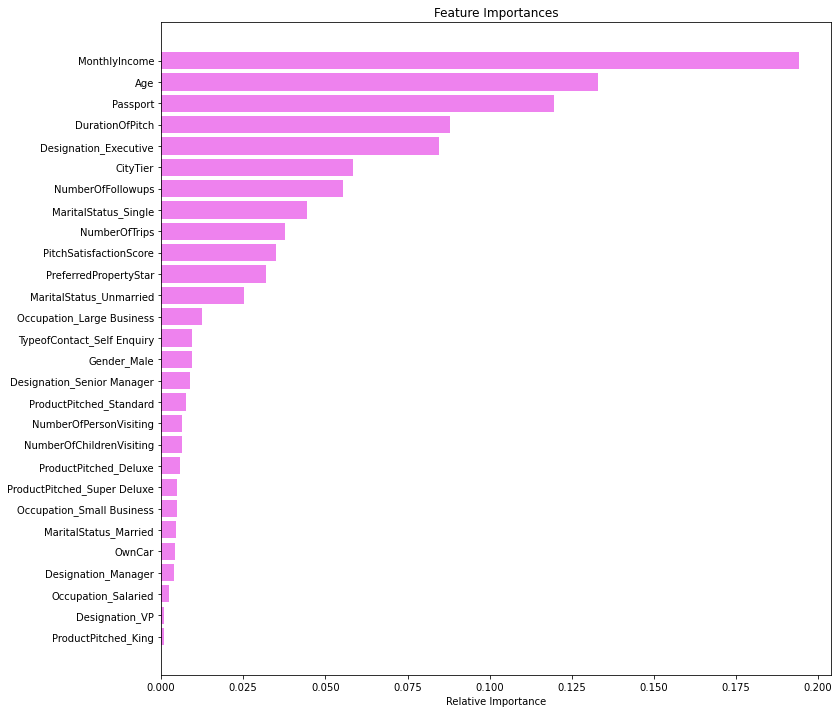

In [90]:
importances = gbc_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Monthly income is the most important feature, followed by Age and Passport, as per the tuned gradient boosting model

# XGBoost Classifier

XGBoost has many hyper parameters which can be tuned to increase the model performance. You can read about them in the xgboost documentation here. Some of the important parameters are:

scale_pos_weight:Control the balance of positive and negative weights, useful for unbalanced classes. It has range from 0 to  ∞ .
subsample: Corresponds to the fraction of observations (the rows) to subsample at each step. By default it is set to 1 meaning that we use all rows.
colsample_bytree: Corresponds to the fraction of features (the columns) to use.
colsample_bylevel: The subsample ratio of columns for each level. Columns are subsampled from the set of columns chosen for the current tree.
colsample_bynode: The subsample ratio of columns for each node (split). Columns are subsampled from the set of columns chosen for the current level.
max_depth: is the maximum number of nodes allowed from the root to the farthest leaf of a tree.
learning_rate/eta: Makes the model more robust by shrinking the weights on each step.
gamma: A node is split only when the resulting split gives a positive reduction in the loss function. Gamma specifies the minimum loss reduction required to make a split.


In [91]:
# Choose the type of classifier. 
xgb_tuned = XGBClassifier(random_state=1)

# Grid of parameters to choose from
## add from
parameters = {
    "n_estimators": np.arange(10,50,20),
    "scale_pos_weight":[0,1,2,5],
    "subsample":[0.5,0.7,0.9,1],
    "learning_rate":[0.01,0.1,0.2,0.05],
    "gamma":[0,1,3],
    "colsample_bytree":[0.5,0.7,0.9,1],
    "colsample_bylevel":[0.5,0.7,0.9,1]
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(xgb_tuned, parameters,scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
xgb_tuned.fit(X_train, y_train)

[20:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[20:34:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_rel

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.7, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=30, n_jobs=4, num_parallel_tree=1, random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=5, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [92]:
#Using above defined function to get accuracy, recall and precision on train and test set
xgb_tuned_score=get_metrics_score(xgb_tuned)

Accuracy on training set :  0.8985676702718504
Accuracy on test set :  0.8500340831629175
Recall on training set :  0.9254658385093167
Recall on test set :  0.8007246376811594
Precision on training set :  0.6659217877094972
Precision on test set :  0.572538860103627


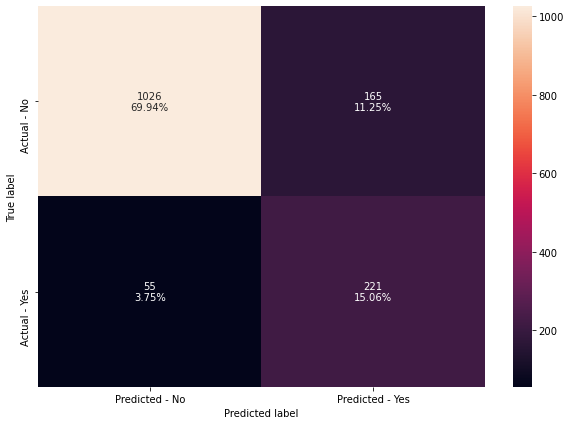

In [93]:
make_confusion_matrix(xgb_tuned,y_test)

## Insights
### The test accuracy of the model has reduced as compared to the model with default parameters but the recall has increased significantly and the model is able to identify most of the defaulters.
### Decreasing number of false negatives has increased the number of false positives here.
### The tuned model is not overfitting and generalizes well.


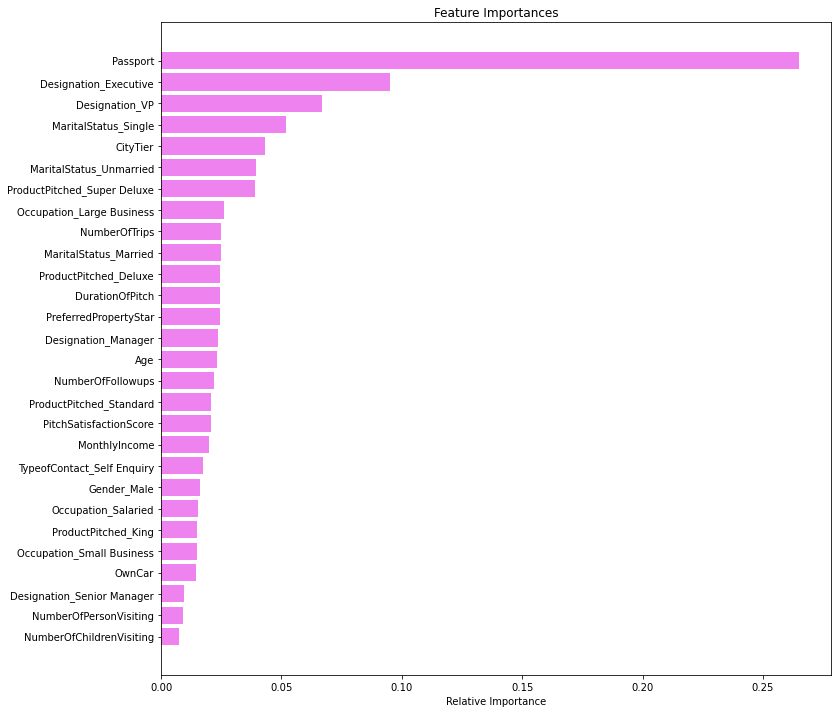

In [94]:
importances = xgb_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(12,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

### Passport is the most important feature, followed by Designation_Executive,Designation_VP and ,MaritalStatus_Single   as per the tuned gradient boosting model.

# Stacking Model
Now, let's build a stacking model with the tuned models - decision tree, random forest and gradient boosting, then use XGBoost to get the final prediction.

In [95]:
estimators = [('Random Forest',rf_estimator), ('Gradient Boosting',gbc_tuned), ('Decision Tree',dtree_estimator)]

final_estimator = xgb_tuned

stacking_classifier= StackingClassifier(estimators=estimators,final_estimator=final_estimator)

stacking_classifier.fit(X_train,y_train)

[21:45:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


StackingClassifier(estimators=[('Random Forest',
                                RandomForestClassifier(max_features=0.7,
                                                       n_estimators=110,
                                                       random_state=1)),
                               ('Gradient Boosting',
                                GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                                                           max_features=0.9,
                                                           n_estimators=250,
                                                           random_state=1,
                                                           subsample=0.8)),
                               ('Decision Tree',
                                DecisionTreeClassifier(class_weight={0: 0.2,
                                                                     1: 0.8},
                                                       max_depth=6...


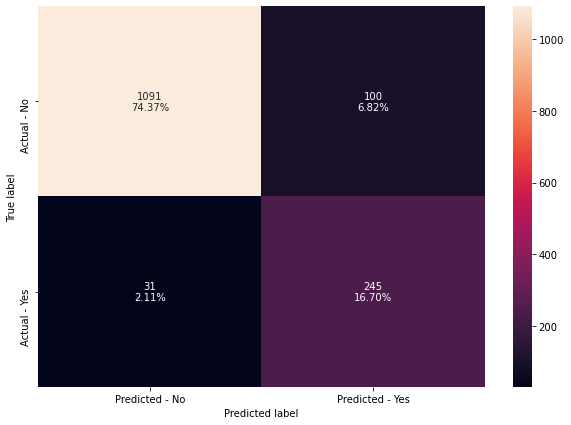

In [97]:
make_confusion_matrix(stacking_classifier,y_test)

In [96]:
#Using above defined function to get accuracy, recall and precision on train and test set
stacking_classifier_score=get_metrics_score(stacking_classifier)

Accuracy on training set :  0.9973691902952353
Accuracy on test set :  0.9107021131561008
Recall on training set :  1.0
Recall on test set :  0.8876811594202898
Precision on training set :  0.9862174578866769
Precision on test set :  0.7101449275362319


# Comparing all models

In [98]:
# defining list of models
models = [abc, abc_tuned, gbc, gbc_init, gbc_tuned, xgb, xgb_tuned,stacking_classifier]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []

# looping through all the models to get the accuracy, precall and precision scores
for model in models:
    j = get_metrics_score(model,False)
    acc_train.append(np.round(j[0],2))
    acc_test.append(np.round(j[1],2))
    recall_train.append(np.round(j[2],2))
    recall_test.append(np.round(j[3],2))
    precision_train.append(np.round(j[4],2))
    precision_test.append(np.round(j[5],2))

In [99]:
comparison_frame = pd.DataFrame({'Model':['AdaBoost with default paramters','AdaBoost Tuned', 
                                          'Gradient Boosting with default parameters','Gradient Boosting with init=AdaBoost',
                                          'Gradient Boosting Tuned','XGBoost with default parameters','XGBoost Tuned','stacking_classifier'], 
                                          'Train_Accuracy': acc_train,'Test_Accuracy': acc_test,
                                          'Train_Recall':recall_train,'Test_Recall':recall_test,
                                          'Train_Precision':precision_train,'Test_Precision':precision_test}) 
comparison_frame

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision
0,AdaBoost with default paramters,0.84,0.85,0.32,0.33,0.69,0.73
1,AdaBoost Tuned,0.94,0.86,0.80,0.56,0.87,0.64
2,Gradient Boosting with default parameters,0.88,0.87,0.44,0.40,0.88,0.80
3,Gradient Boosting with init=AdaBoost,0.89,0.87,0.45,0.38,0.89,0.80
4,Gradient Boosting Tuned,0.92,0.88,0.61,0.49,0.94,0.82
5,XGBoost with default parameters,1.00,0.93,1.00,0.69,1.00,0.89
6,XGBoost Tuned,0.90,0.85,0.93,0.80,0.67,0.57
7,stacking_classifier,1.00,0.91,1.00,0.89,0.99,0.71


# Business Insights and Recommendations.

We have been able to build a predictive model: 
a) that company can deploy this model to identify customers who are are buying Travel Package.
b) that company can use to find the drivers of buying Travel Package.. 
c) based on which company can take appropriate actions to promote Travel Package..

Important Factors that incease sales of the Travel Package -Passport, Monthly Income, Designation_Executive,Designation_VP, and Age.
#### The number of customers with Passport are buying Travel Package compared to customers without Passport.
#### We should target moderate income customers - Customers having income between 18k-24k dollars dollars should the leads. 
#### We should offer Travel Package to customers who are Designation Executive  level greater than other Designation as they have a higher chance of taking a Travel Package.
#### Younger customers are the ones that buy Travel Package more- the company can make sure the Younger customers to Wellness Tourism Package. Wellness Tourism is defined as Travel that allows the traveler to maintain, enhance or kick-start a healthy lifestyle, and support or increase one's sense of well-being.
#### The number of customers with Marital Status Single are buying Travel Package compared to other groups.
#### We should increase the duration of pitch – As  more the duration of pitch more customers will taking a Travel Package.
#### We should increase Number of Followups  – As more NumberOfFollowup will  the customers to  taking a Travel Package.
#### We should target the customers with a big size city as they would more interested in taking a Travel Package -Generally a Teir1 Citeis are have more chances of a customer taking a Travel Package.
#### We should target customers who have Designation VP with the Designation - Our analysis shows that more % of the customers have a interested in buying Travel Package.
####  Own Car,Number Of Children Visiting, Number Of Person Visiting,Designation Senior Manager are less important features.

#### Our Customer interaction  technique is working well as the ratings given by Customers  in PitchSatisfactionScore, ProductPitched, NumberOfFollowups, and DurationOfPitch shows a  significant difference between buying Travel Packag and not buying Travel Package by customers. These scales can act as a preliminary step to understand the ssatisfaction of cutomers - Lower the rating higher are the chances of  not buying Travel Package.